### CMPINF 2100 Final Project - Main Report
### Purpose: Predicting a track's popularity using data about the songs.
The final project consists of six sections:
* Introduction
* Exploratory Data Analysis (EDA)
* Clustering
* Models: Fitting and Interpretation
* Models: Predictions
* Models: Performance and Validation

### 1. Introduction

Before starting this project, I read a few articles about what makes a song popular and realized it is pretty complex to predict popularity. Many articles describe the acoustic and metadata features as two sections contributing to a song's popularity. 

I decided to do a **classification problem** with the `track_popularity` as a `binary_outcome` with a threshold of greater than 50 as 1 (event) and 50 or less as 0 (non-event).

#### **MAJOR FINDINGS**:
I think the biggest things I realized in my specific projects are 1) how hard it is to find/explore trends, 2) how hard it can be to infer from visualizations, and 3) how hard it is to find confidence in choosing the correct predictor variables.

The three acoustic features that did seem to show the most promise and have a relationship with popularity were `acousticness`, `danceability`, and `energy`. When I plotted the relationships between the `binary_outcome` and these variables on both boxplots and point plots, I always found that there were slight differences between the events. Additionally, when I ran the PCA, I found that the first two principal components accounted for the most variance. Specifically, `acousticness` and `energy` had loading values of 0.49 and -0.60 in PC1, respectively. For PC2, `danceability` had -0.56 and `valence` had -0.51. 

In the training only model, Model 6 was thought to be the best, but from the CV, it might not be great with new data. After CV, I found that Model 5 was better than 6 with new data but it still wasn't great overall and it still did worse with Testing. The Accuracy was below .60 but testing and training Accuracies were very close. Although I didn't find a great model, I think I realized and appreaciated how complicated the overall process is..from visualizing to choosing predictors to modeling.

**Which inputs/features seem to influence the response/outcome the most?**

I found that `danceability` and `valence` were rockstars when it came to most of the models and makes me think that maybe they are important factors in all of this.

**What supported your conclusion? Was it only through predictive models?**

The models supported my conclusions. Those two variables either had a main effect or some interaction that was significant and at the higher end of the coefficients when it came to magnitude. 

**Could EDA help identify similar trends/relationships?**

It is interesting because the trend plots didn't really show a strong relationship between the output and those two variables. I initially thought that `energy` or `acousticness` were going to be better at predicting popularity. 

Looking at the PCA, `energy` and `acousticness` had high loading values in PC01 and PC02 so thats what made me think that those two would be better at predicting. 

Looking at the point plots, both `danceability` and `valence` had averages that didn't really overlap AND they did have a correlation of 0.34.

**Was clustering consistent with any conclusions from the predictive models?**

I don't think so. I found that the cluster analysis confused me a little more. The PCA analysis actually proved to be a bit better because I was able to see what variables that were correlated were more useful as predictors. 

**What skills did you learn from going through this project?**


**This is not related to application or project inputs/outputs directly.**

**What general skills can you take away from the project to apply to applications more specific to your area of interest?**

I think I am more interesting in filling in the gaps of my knowledge. I know how to do all these pieces (PCA, standardizing, CV, tuning) but this project really highlighted how fragmented or disconnected everything felt to me. I am learning to harmonize the process a little more.  

I knew this project was going to be hard, but I think I just expected to find answers really easily. So, one thing I will take away from this assignment is to not expect things to happen and to expect the unexpected. 

## B. Exploratory Data Analysis (EDA)

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import seaborn as sns

#### Read Data

In [2]:
songs_url = 'https://raw.githubusercontent.com/rfordatascience/tidytuesday/master/data/2020/2020-01-21/spotify_songs.csv'

In [3]:
df = pd.read_csv(songs_url)

In [5]:
spotify_df = df.copy()

#### a) Basic Information:
**1 - How many rows and columns?**

In [5]:
spotify_df.shape

(32833, 23)

The spotify_df dataset has **32833 rows** and **23 columns**.

**2 - What are the variable names\
3 - What are the data types of the variables**

In [6]:
spotify_df.dtypes

track_id                     object
track_name                   object
track_artist                 object
track_popularity              int64
track_album_id               object
track_album_name             object
track_album_release_date     object
playlist_name                object
playlist_id                  object
playlist_genre               object
playlist_subgenre            object
danceability                float64
energy                      float64
key                           int64
loudness                    float64
mode                          int64
speechiness                 float64
acousticness                float64
instrumentalness            float64
liveness                    float64
valence                     float64
tempo                       float64
duration_ms                   int64
dtype: object

There are **13 numeric** variables (9 float, 4 integers) and **10 object** variables.

**4 - Number of missing values per variable**

In [7]:
spotify_df.isna().sum().loc[spotify_df.isna().sum() > 0]

track_name          5
track_artist        5
track_album_name    5
dtype: int64

The three variables, `track_name`, `track_artist`, `track_album_name` are all missing data.

**5 - The number of unique values per column**

In [8]:
spotify_df.nunique()

track_id                    28356
track_name                  23449
track_artist                10692
track_popularity              101
track_album_id              22545
track_album_name            19743
track_album_release_date     4530
playlist_name                 449
playlist_id                   471
playlist_genre                  6
playlist_subgenre              24
danceability                  822
energy                        952
key                            12
loudness                    10222
mode                            2
speechiness                  1270
acousticness                 3731
instrumentalness             4729
liveness                     1624
valence                      1362
tempo                       17684
duration_ms                 19785
dtype: int64

Converted `key` and `mode` to categorical inputs!

In [8]:
for var in ["key", "mode"]:
    spotify_df[var] = spotify_df[var].astype("category")

In [9]:
vars_of_interest = ["track_id", "playlist_genre", "key", "mode"] + [var for var in spotify_df.select_dtypes("number").columns.to_list()] + ["binary_outcome", "binary_outcome_60", "binary_outcome_70", "track_popularity_tf"]

Converting the binary outcome.

In [10]:
spotify_df['binary_outcome'] = np.where(spotify_df.track_popularity > 50, 1, 0)
spotify_df['binary_outcome_60'] = np.where(spotify_df.track_popularity > 60, 1, 0)
spotify_df['binary_outcome_70'] = np.where(spotify_df.track_popularity > 70, 1, 0)

In [12]:
vars_of_interest

['track_id',
 'playlist_genre',
 'key',
 'mode',
 'track_popularity',
 'danceability',
 'energy',
 'loudness',
 'speechiness',
 'acousticness',
 'instrumentalness',
 'liveness',
 'valence',
 'tempo',
 'duration_ms',
 'binary_outcome',
 'binary_outcome_60',
 'binary_outcome_70',
 'track_popularity_tf']

In [11]:
y_cats = ["binary_outcome", "binary_outcome_60", "binary_outcome_70"]

In [12]:
x_cats = ["key", "mode", "playlist_genre"]

In [13]:
x_nums = [var for var in vars_of_interest if var not in 
          ["track_id", "key", "mode", "playlist_genre", "track_popularity", "track_popularity_tf", "binary_outcome", "binary_outcome_60", "binary_outcome_70"]]
x_nums.sort()

**SAMPLE SIZE**: Originally, I wanted to include ALL songs, but I decided to keep only songs (`track_id`) that had one row in the whole dataset (N=25190)

In [14]:
spotify_new = spotify_df.groupby('track_id').filter(lambda x: len(x) == 1).loc[:, vars_of_interest[:-1]]

In [15]:
spotify_new

,track_id,playlist_genre,key,mode,track_popularity,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,binary_outcome,binary_outcome_60,binary_outcome_70
3,75FpbthrwQmzHlBJLuGdC7,pop,7,1,60,0.718,0.930,-3.778,0.1020,0.028700,0.000009,0.2040,0.2770,121.956,169093,1,0,0
4,1e8PAfcKUYoKkxPhrHqw4x,pop,1,1,69,0.650,0.833,-4.672,0.0359,0.080300,0.000000,0.0833,0.7250,123.976,189052,1,1,0
6,2OAylPUDDfwRGfe0lYqlCQ,pop,5,0,62,0.449,0.856,-4.788,0.0623,0.187000,0.000000,0.1760,0.1520,112.648,187675,1,1,0
10,3eFJI470ALf1EYjywPRsJy,pop,6,1,58,0.679,0.923,-6.500,0.1810,0.146000,0.000005,0.1240,0.7520,121.984,207894,1,0,0
12,6e0CvGZf7CouOpYF8toXHC,pop,1,1,67,0.744,0.726,-4.675,0.0463,0.039900,0.000000,0.3740,0.6870,121.985,192507,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32828,7bxnKAamR3snQ1VGLuVfC1,edm,2,1,42,0.428,0.922,-1.814,0.0936,0.076600,0.000000,0.0668,0.2100,128.170,204375,0,0,0
32829,5Aevni09Em4575077nkWHz,edm,0,1,20,0.522,0.786,-4.462,0.0420,0.001710,0.004270,0.3750,0.4000,128.041,353120,0,0,0
32830,7ImMqPP3Q1yfUHvsdn7wEo,edm,6,0,14,0.529,0.821,-4.899,0.0481,0.108000,0.000001,0.1500,0.4360,127.989,210112,0,0,0
32831,2m69mhnfQ1Oq6lGtXuYhgX,edm,2,1,15,0.626,0.888,-3.361,0.1090,0.007920,0.127000,0.3430,0.3080,128.008,367432,0,0,0


**Categorical Counts via Bar Chart**

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


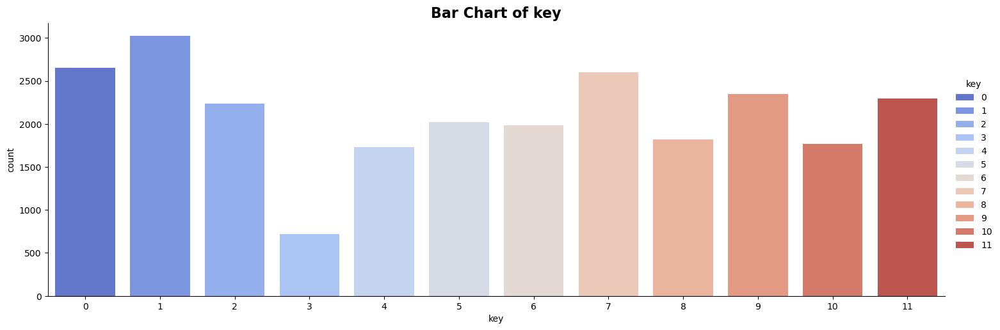

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


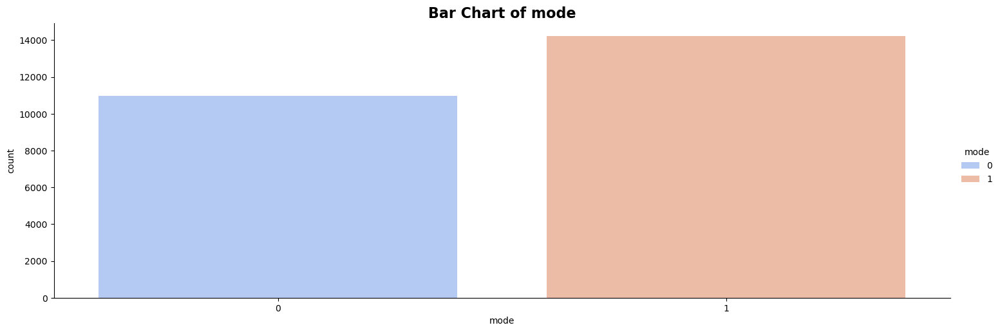

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


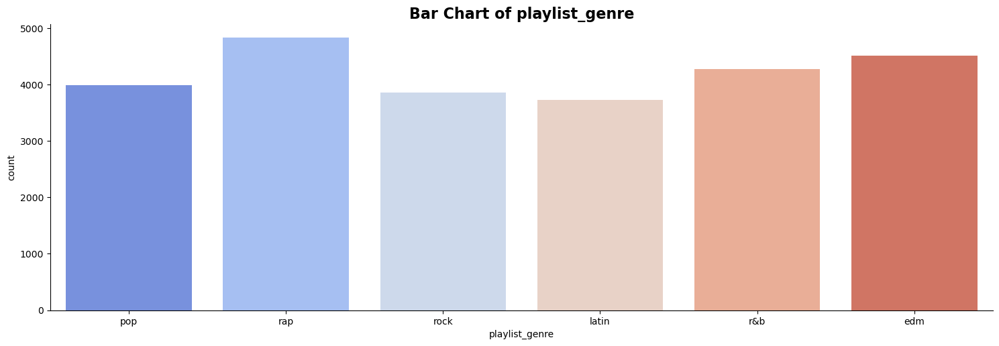

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


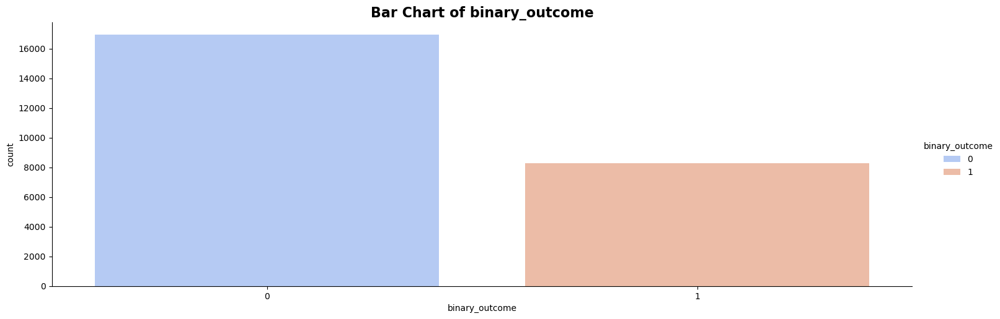

In [18]:
for var in x_cats + ["binary_outcome"]:
    sns.catplot(data=spotify_new, x=var, hue=var, kind="count", aspect=3, palette="coolwarm")
    plt.title("Bar Chart of %s" % var, fontsize=16, fontweight="bold")
    if var == "playlist_subgenre":
        # Set x-axis labels to be horizontal
        plt.xticks(rotation=45)
    plt.show()

In [19]:
spotify_new.binary_outcome.value_counts(normalize=True)

binary_outcome
0    0.672092
1    0.327908
Name: proportion, dtype: float64

From the Bar Charts above, we see that there are some differences between `key` groups, specifically `key` = 3 having a noticeably lower count compared to the others. We see that there are more `mode` = 1, and for `playlist_genre` we find that most of the groups are even.

For the `binary_outcome`, we find that 67% of the data is non-events and 33% are events.

**Continuous Distributions via Histograms**

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


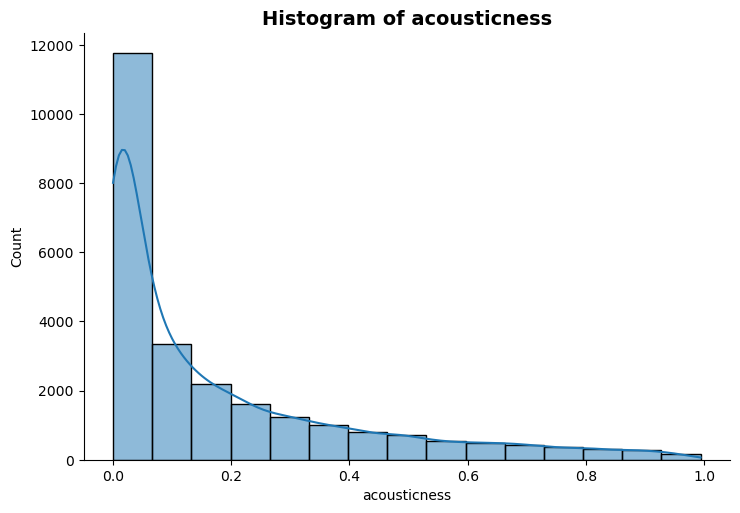

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


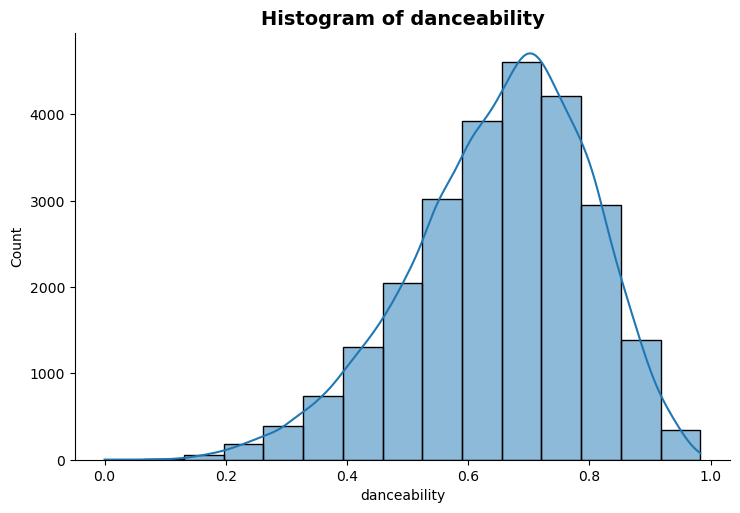

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


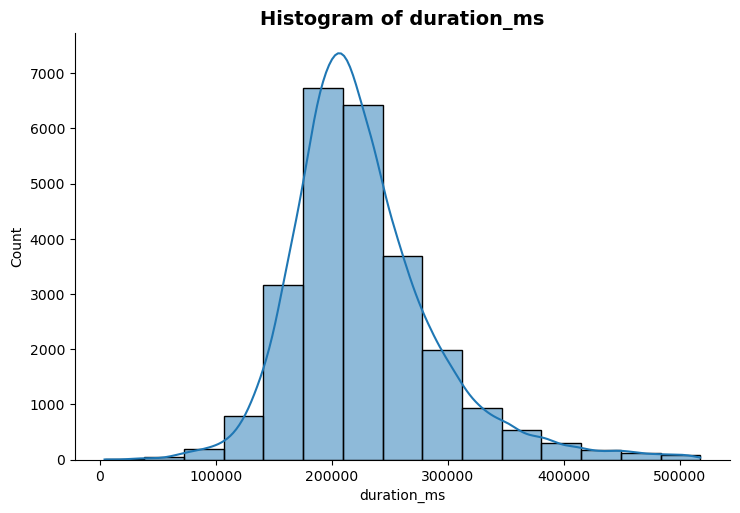

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


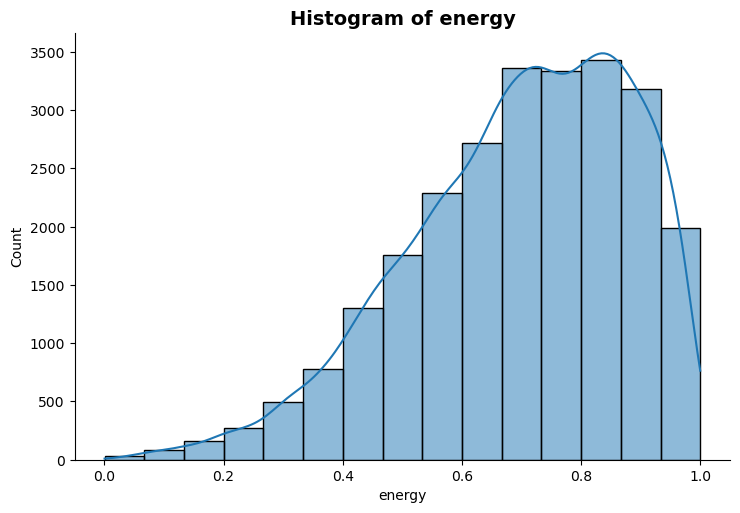

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


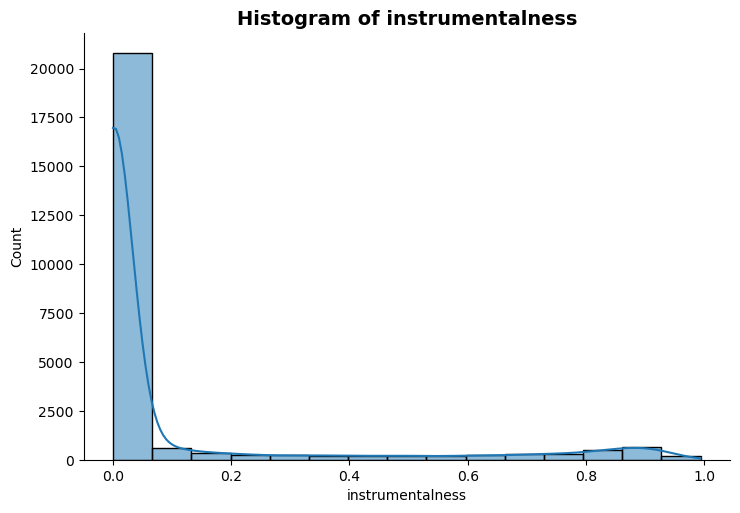

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


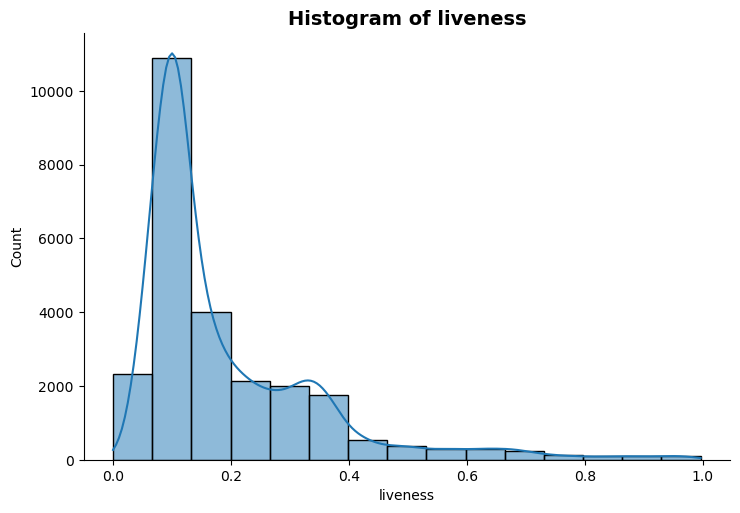

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


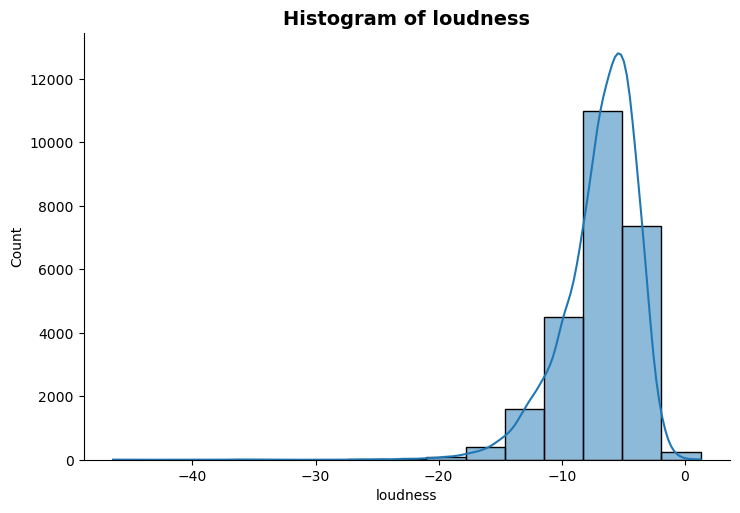

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


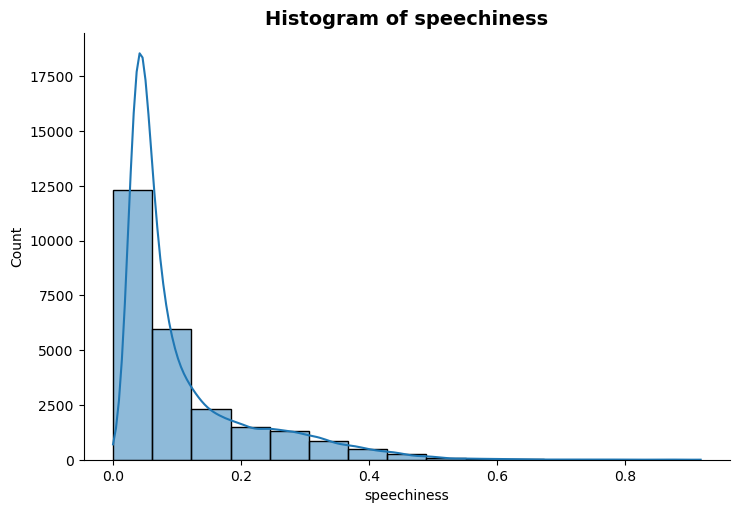

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


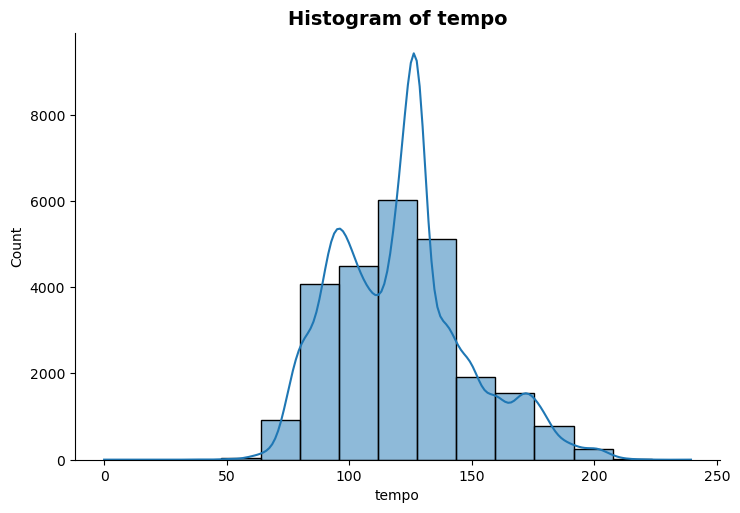

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


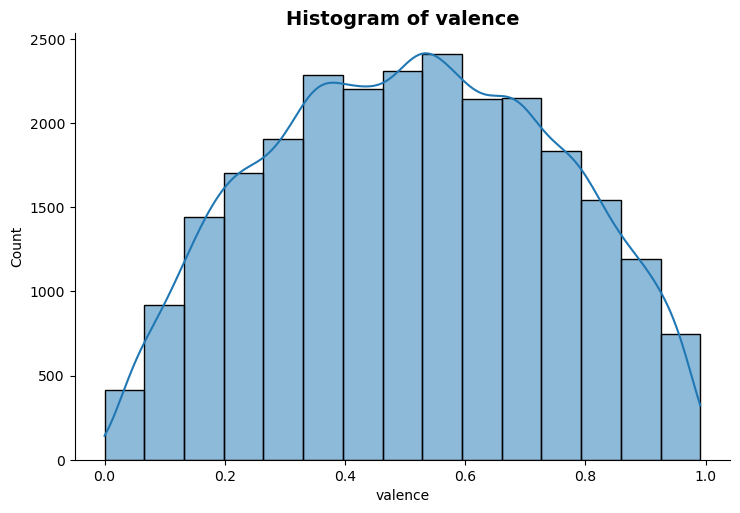

In [20]:
for var in x_nums:
    sns.displot(data=spotify_new, x=var, kind="hist", common_norm=False, bins=15, kde=True, aspect=1.5)
    plt.title("Histogram of %s" % var, fontsize=14, fontweight="bold")
    plt.show()

From the Histogram plots, we see that `duration_ms`, `tempo` and `valence` are all somewhat normally distributed.\
Those that are left skewed: `danceability`, `energy`, and `loudness`.\
Those that are right skewed: `speechiness`, `acousticness`, `instrumentalness`, and `liveness`.

**Heatmaps of categorical inputs and the outcome**

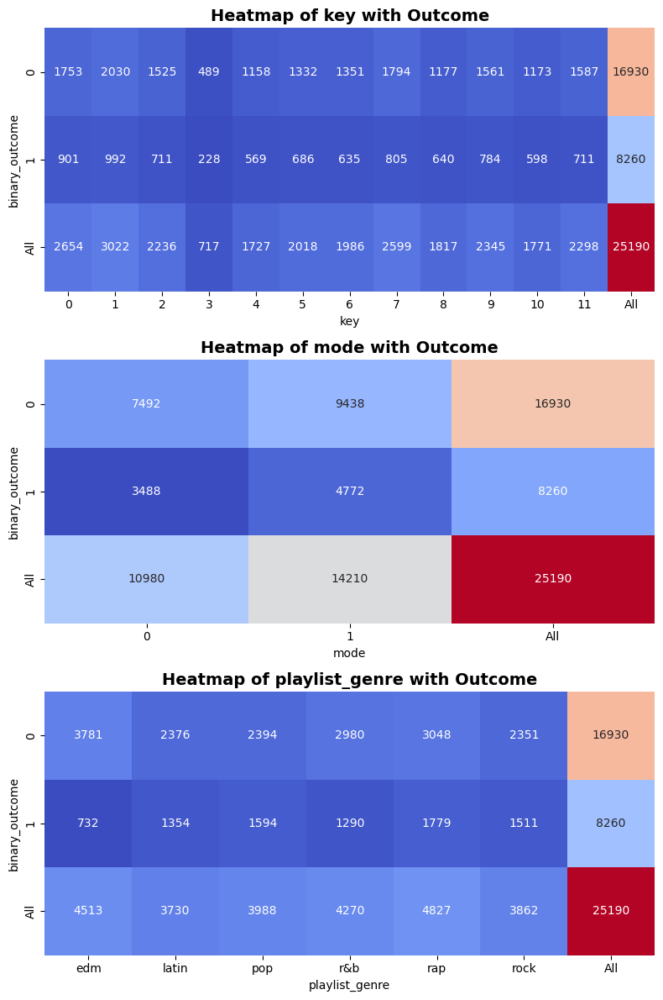

In [21]:
fig, axs = plt.subplots(len(x_cats), 1, figsize=(8, 12), sharex=False, sharey=False)

for i, var in enumerate(x_cats):
    crosstab = pd.crosstab(spotify_new['binary_outcome'], spotify_new[var], margins=True)
    
    # Plot heatmap
    sns.heatmap(data=crosstab, 
                annot=True,
                fmt='d', 
                cbar=False,
                annot_kws={"fontsize": 10},
                cmap="coolwarm",
                ax=axs[i])
    
    axs[i].set_title(f"Heatmap of {var} with Outcome", fontsize=14, fontweight="bold")

plt.tight_layout()
plt.show()

Looking at the heatmaps comparing the categorical inputs with the binary outcome, we find that the distributions are somewhat even across the `key` and `playlist_genre`. The `mode` variable does show that there are more tracks with `mode` = 1 and `binary_outcome` = 1 compared to the others.

**Boxplots and Pointplots of continuous inputs by the outcome**

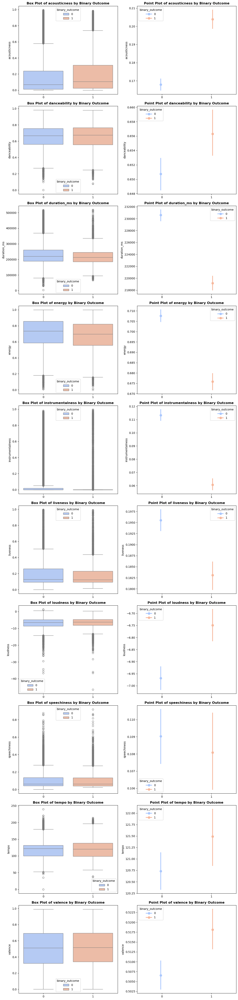

In [22]:
fig, axes = plt.subplots(len(x_nums), 2, figsize=(12, 5 * len(x_nums)))  # Adjust the size dynamically

for i, var in enumerate(x_nums):
    # Boxplot
    sns.boxplot(data=spotify_new, x="binary_outcome", y=var, hue="binary_outcome", palette="coolwarm", ax=axes[i, 0])
    axes[i, 0].set_title(f"Box Plot of {var} by Binary Outcome", fontsize=12, fontweight="bold")
    axes[i, 0].set_xlabel("") 
    
    # Point plot
    sns.pointplot(data=spotify_new, x="binary_outcome", y=var, hue="binary_outcome", palette="coolwarm", ax=axes[i, 1], dodge=True)
    axes[i, 1].set_title(f"Point Plot of {var} by Binary Outcome", fontsize=12, fontweight="bold")
    axes[i, 1].set_xlabel("") 
    
plt.tight_layout()
plt.show()

When looking at the boxplots comparing the continuous inputs with the binary outcome, we find that `acousticness` is one of the only inputs that has a slightly different median even if the distributions overlap.\
For the point plots, we find that `acousticness`, `danceability`, `duration_ms`, `energy`, `instrumentalness`, `liveness`, `loudness`, and `valence` all had averages that did not overlap between events, which highlights how different they may be. 

**Pair Plots to visualize relationship between continuous inputs with binary outcome**

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


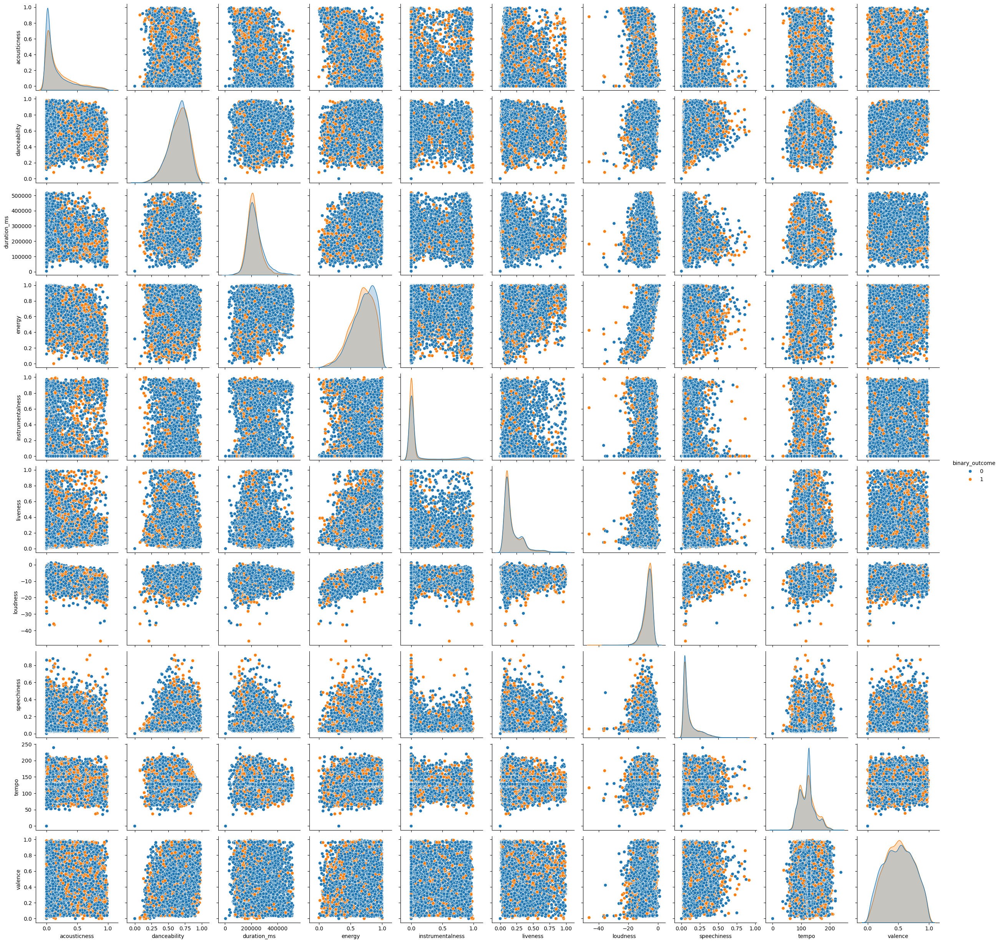

In [23]:
sns.pairplot(data=spotify_new.loc[:, ["binary_outcome"]+x_nums], 
             hue="binary_outcome", 
             diag_kind="kde", 
             diag_kws={"common_norm": False})

plt.show()

When we visualize the relationships between continuous inputs with the binary_outcome, we find that there really is not pattern that we can see. Both events are represented in the same positions in ALL scatter plots, whichi ultimately sucks. 

**Correlation Plot via Heatmap**

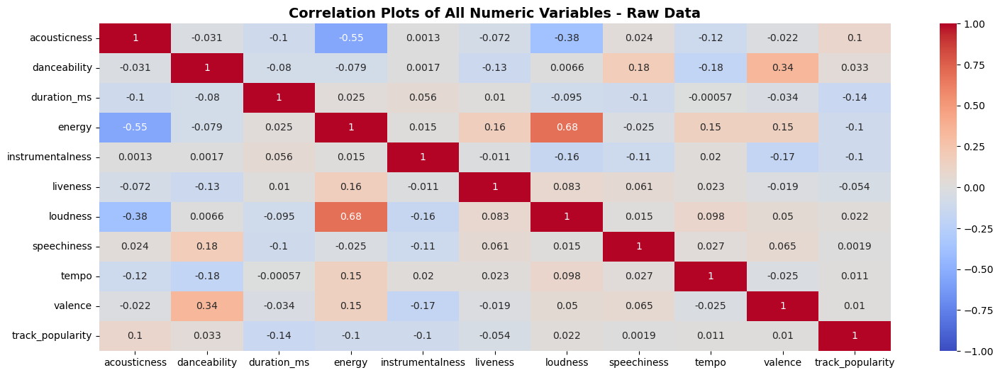

In [24]:
fig, ax = plt.subplots(figsize=(18,6))

sns.heatmap(data=spotify_new.loc[:,x_nums +["track_popularity"]].corr(numeric_only=True), 
            vmin=-1,
            vmax=1,
            center=0,
            annot=True,
            annot_kws={"fontsize": 10},
            cmap="coolwarm",
            ax=ax)

ax.set_title("Correlation Plots of All Numeric Variables - Raw Data", fontsize=14, fontweight="bold")
plt.show()

With the Heatmap above, we find that `acousticness` is correlated with energy (-0.55) and loudness (-0.38). The variable `danceability` is  moderately correlated with `valence` (0.34). And `energy` is highly correlated with `loudness` at 0.68.

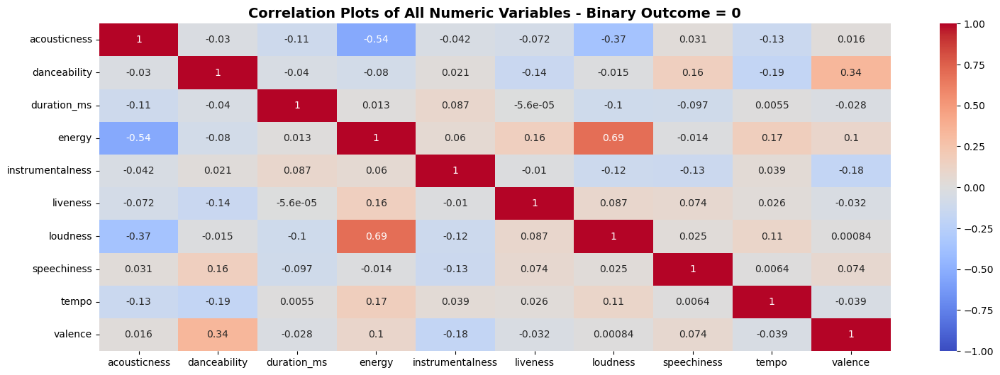

In [25]:
fig, ax = plt.subplots(figsize=(18,6))

sns.heatmap(data=spotify_new.loc[spotify_new.binary_outcome == 0,x_nums].corr(numeric_only=True), 
            vmin=-1,
            vmax=1,
            center=0,
            annot=True,
            annot_kws={"fontsize": 10},
            cmap="coolwarm",
            ax=ax)

ax.set_title("Correlation Plots of All Numeric Variables - Binary Outcome = 0", fontsize=14, fontweight="bold")
plt.show()

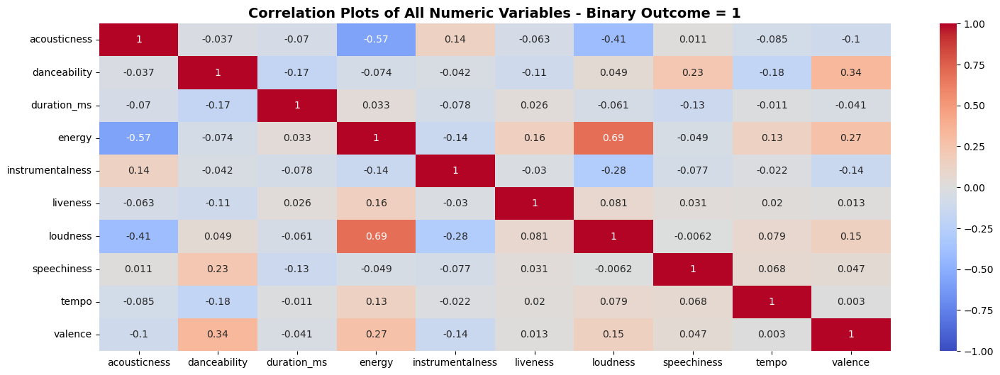

In [26]:
fig, ax = plt.subplots(figsize=(18,6))

sns.heatmap(data=spotify_new.loc[spotify_new.binary_outcome == 1,x_nums].corr(numeric_only=True), 
            vmin=-1,
            vmax=1,
            center=0,
            annot=True,
            annot_kws={"fontsize": 10},
            cmap="coolwarm",
            ax=ax)

ax.set_title("Correlation Plots of All Numeric Variables - Binary Outcome = 1", fontsize=14, fontweight="bold")
plt.show()

Comparing the correlations for each event, we find that some of the correlations are increased for the event (`binary_outcome` = 1).\
`speechiness` and `danceability` have a correlation that is now 0.23 or `valence` and `energy` has increased to 0.27.

**Comparing continuous inputs with categorial variables**

Specifically, I was interested in `playlist_genre` and `key` because these were mentioned in the literature.

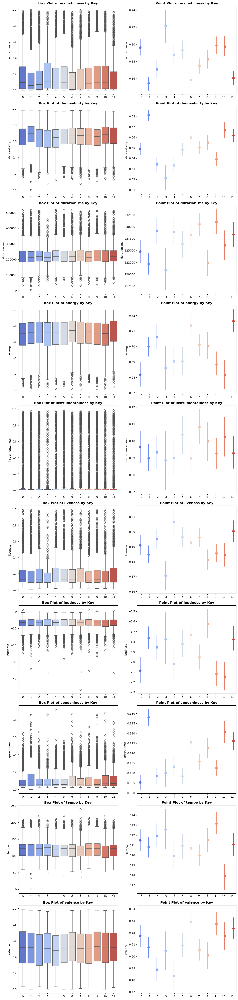

In [27]:
fig, axes = plt.subplots(len(x_nums), 2, figsize=(12, 5 * len(x_nums)))

for i, var in enumerate(x_nums):
    # Boxplot
    sns.boxplot(data=spotify_new, x="key", y=var, hue="key", palette="coolwarm", ax=axes[i, 0])
    axes[i, 0].set_title(f"Box Plot of {var} by Key", fontsize=12, fontweight="bold")
    axes[i, 0].set_xlabel("") 
    axes[i, 0].legend_.remove()
    
    # Point plot
    sns.pointplot(data=spotify_new, x="key", y=var, hue="key", palette="coolwarm", ax=axes[i, 1], dodge=True)
    axes[i, 1].set_title(f"Point Plot of {var} by Key", fontsize=12, fontweight="bold")
    axes[i, 1].set_xlabel("") 
    axes[i, 1].legend_.remove()
    
plt.tight_layout()
plt.show()

Overall, the distributions comparing each continuous input with `key` shows that there isn't much different. However, in the point plots, we see that `acousticness`, `danceability`, `energy` and `speechiness` have some differences in their averages across groups

With these plots, there are differences in some groups but overall there are many of the key groups that overlap in their averages.

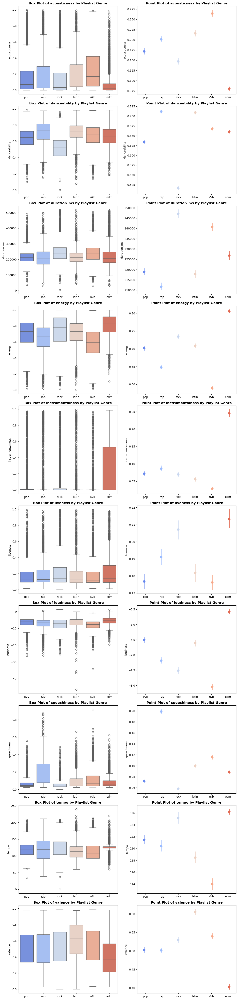

In [28]:
fig, axes = plt.subplots(len(x_nums), 2, figsize=(12, 5 * len(x_nums)))

for i, var in enumerate(x_nums):
    # Boxplot
    sns.boxplot(data=spotify_new, x="playlist_genre", y=var, hue="playlist_genre", palette="coolwarm", ax=axes[i, 0])
    axes[i, 0].set_title(f"Box Plot of {var} by Playlist Genre", fontsize=12, fontweight="bold")
    axes[i, 0].set_xlabel("") 
    # axes[i, 0].legend_.remove()
    
    # Point plot
    sns.pointplot(data=spotify_new, x="playlist_genre", y=var, hue="playlist_genre", palette="coolwarm", ax=axes[i, 1], dodge=True)
    axes[i, 1].set_title(f"Point Plot of {var} by Playlist Genre", fontsize=12, fontweight="bold")
    axes[i, 1].set_xlabel("") 
    # axes[i, 1].legend_.remove()
    
plt.tight_layout()
plt.show()

Looking at the `playlist_genre`, we see that the following variables have differences in the distributions across genre groups: `acoutsticness`, `danceability`, `energy`, `speechiness`, `tempo`, and `valence`. \
Looking at the points plots, all the variables seem to have many groups that don't overlap averages.

This suggests to me that there may be a relationship between genre and these features and that might be helpful in determining popularity. For example, we see that edm has higher averages in `instrumentalness`, and `loudness` so is that associated with a song being popular or not? If we know that a song is a particular genre, can we determine its features?

**Trend Plots for Logistic Regression**

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


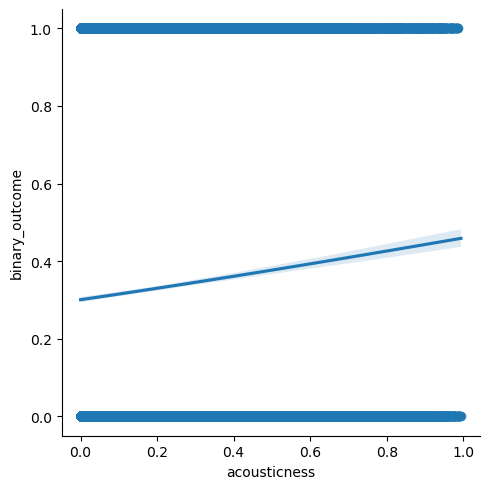

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


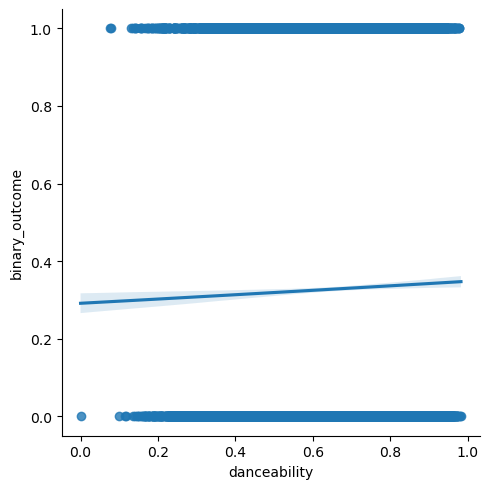

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


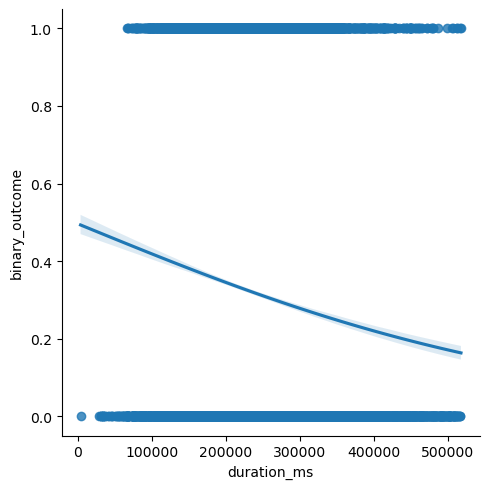

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


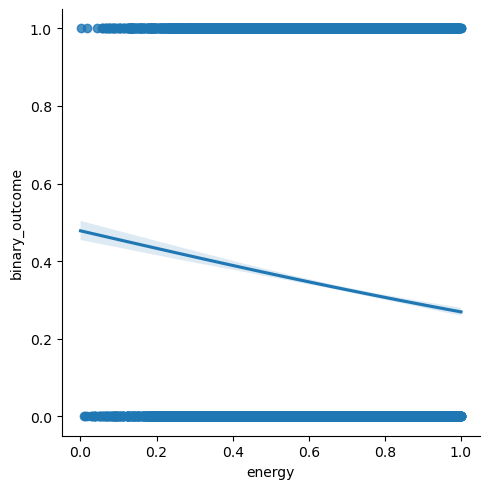

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


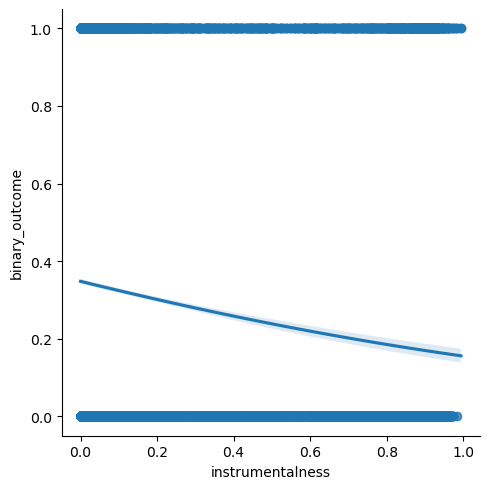

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


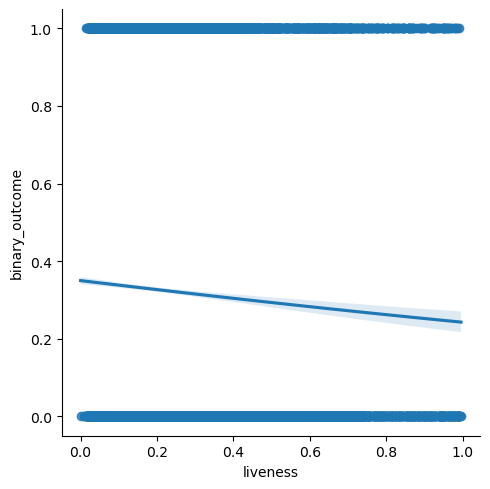

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


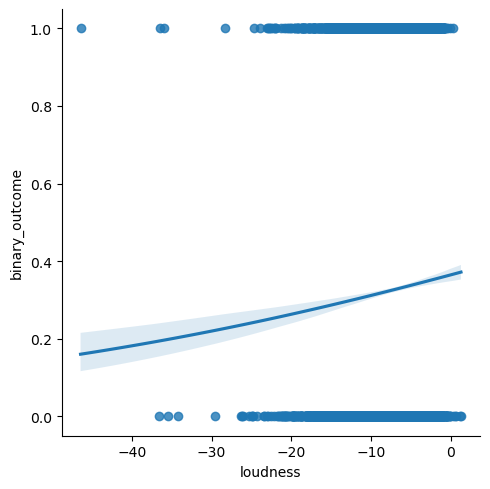

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


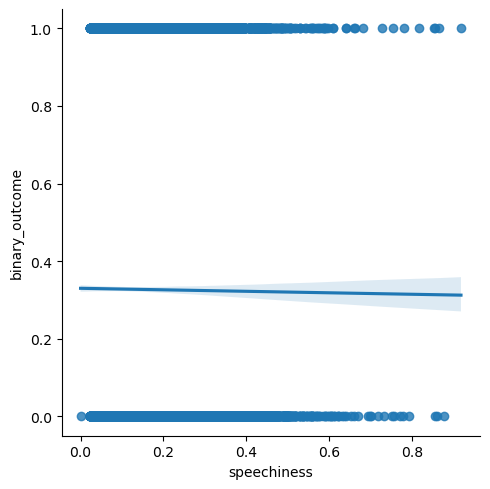

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


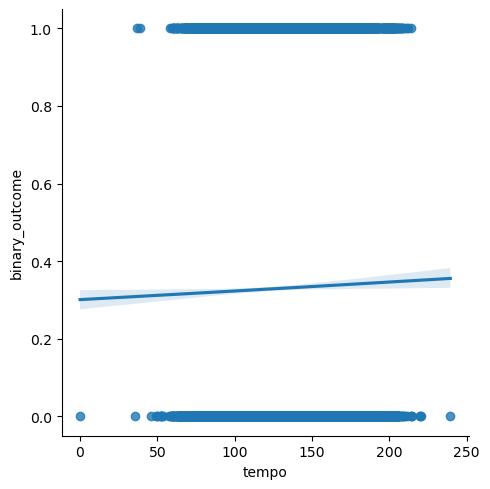

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


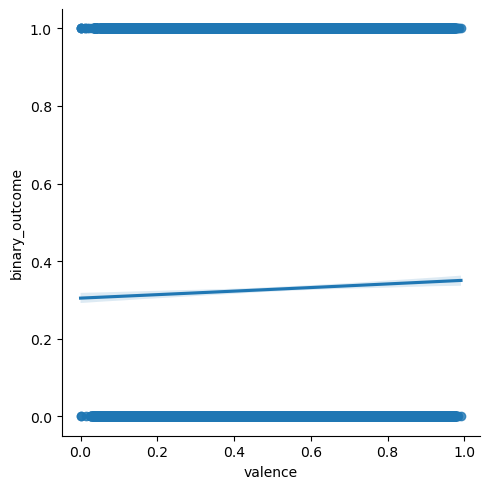

In [29]:
for var in x_nums:
    sns.lmplot(data=spotify_new, x=var, y="binary_outcome", logistic=True)
    plt.show()

After looking at all of the EDA plots and looking at the trend plots, my prediction is that `acousticness`, `danceability`, `energy`, `speechiness`, `instrumentalness` `tempo`,`valence` and `playlist_genre` might be good predictors to use in our model.

They all seem to have some relationships to our outcome and the genre is showing dfferences in these certain song features, which may be helpful in predicting popularity using these features. 

**Transforming Data**

In [18]:
from scipy.stats import boxcox

The following are showing skewness:
* Left:
    * Danceability
    * Energy
    * Loudness
* Right:
    *  Speechiness
    *  Acousticness
    *  Instrumentalness
    *  Liveness

In [16]:
spotify_transf = spotify_new.copy()

For variables bounded between 0 and 1.

In [19]:
logtf_list = ["acousticness", "danceability", "energy", "speechiness", "instrumentalness", "liveness"]

for var in logtf_list:
    spotify_transf[var+"_shift"] = np.where(spotify_transf[var] == 1.0, spotify_transf[var] - 0.01, spotify_transf[var])
    spotify_transf[var+"_shift"] = np.where(spotify_transf[var] == 0.0, spotify_transf[var] + 0.01, spotify_transf[var+"_shift"])
    spotify_transf[var+'_logit'] = np.log( spotify_transf[var+"_shift"] / (1 - spotify_transf[var+"_shift"]) )
    spotify_transf[var+'_log'] = np.log( spotify_transf[var+"_shift"] )
    transformed_data, lambda_value = boxcox(spotify_transf[var+"_shift"])
    spotify_transf[var+'_boxcox'] = transformed_data 

In [20]:
extra_list = ["loudness"]

for var in extra_list:
    spotify_transf[var+'_sqrd'] = ( spotify_transf[var] )**2
    spotify_transf[var+'_cubed'] = ( spotify_transf[var] )**3
    
    lower_threshold = np.percentile(spotify_transf[var], 5)
    upper_threshold = np.percentile(spotify_transf[var], 95)

    # Winsorize the data
    spotify_transf[var+'_wins'] = np.clip(spotify_transf[var], lower_threshold, upper_threshold)

In [21]:
x_nums_std = [var  + "_logit" for var in logtf_list ] + [var  + "_log" for var in logtf_list] + [var  + "_boxcox" for var in logtf_list] + ["loudness_sqrd", "loudness_cubed", "loudness_wins"]

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


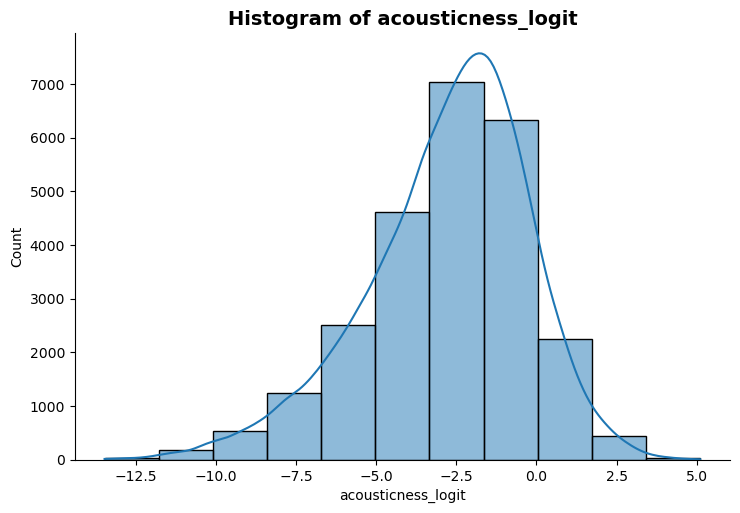

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


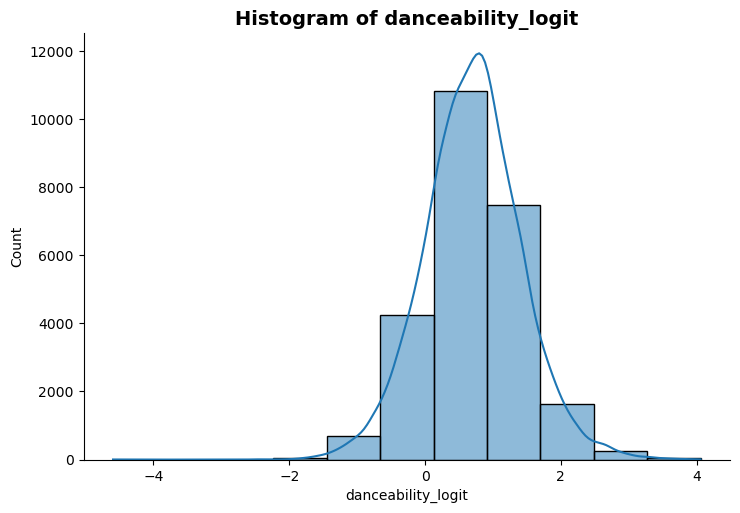

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


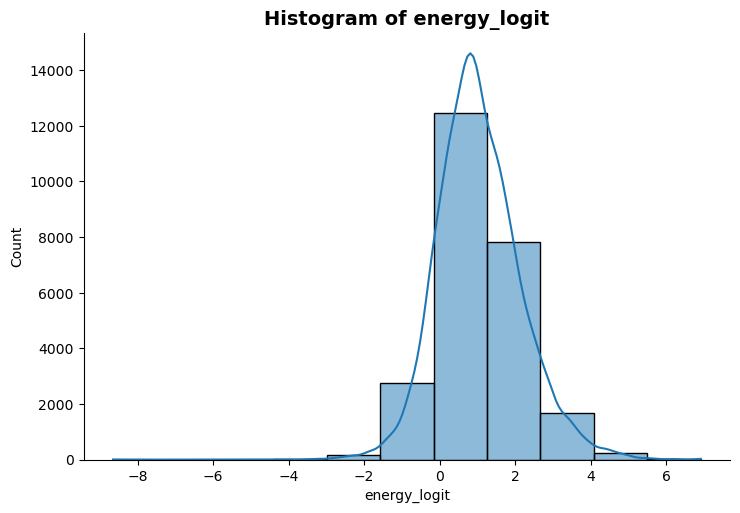

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


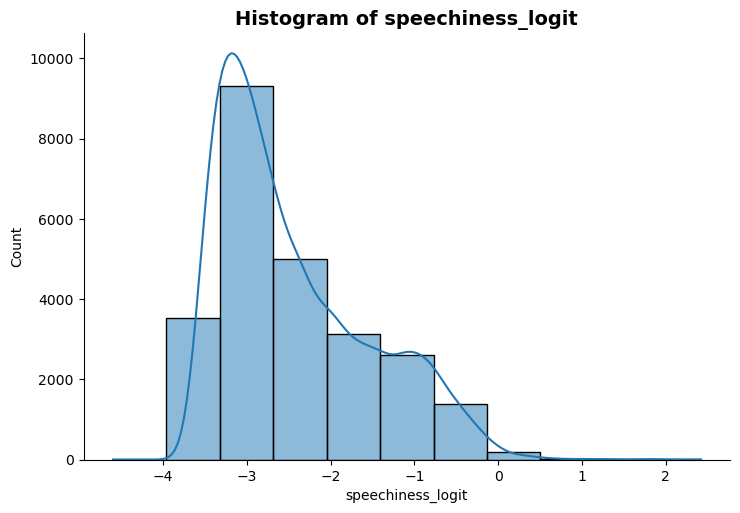

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


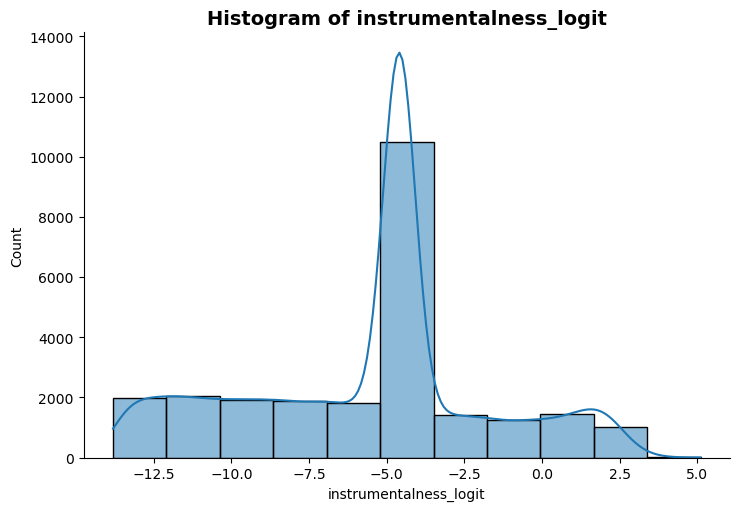

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


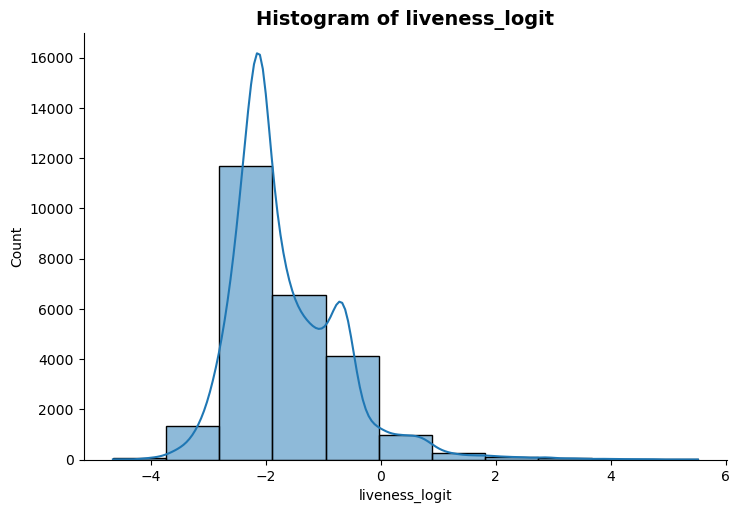

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


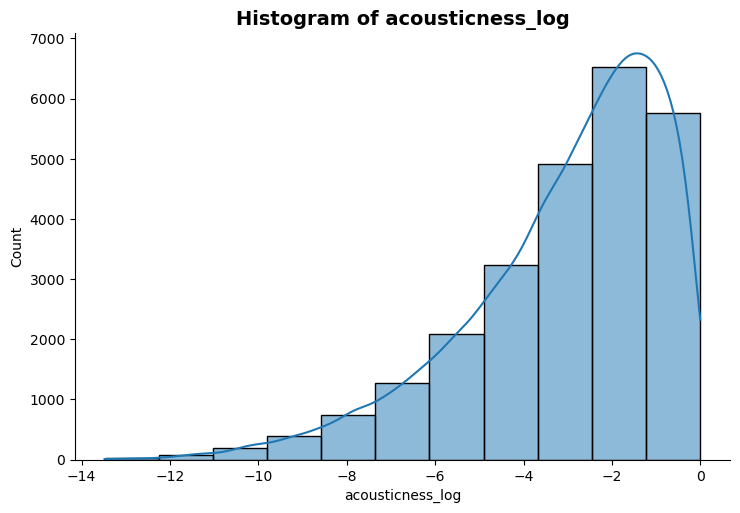

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


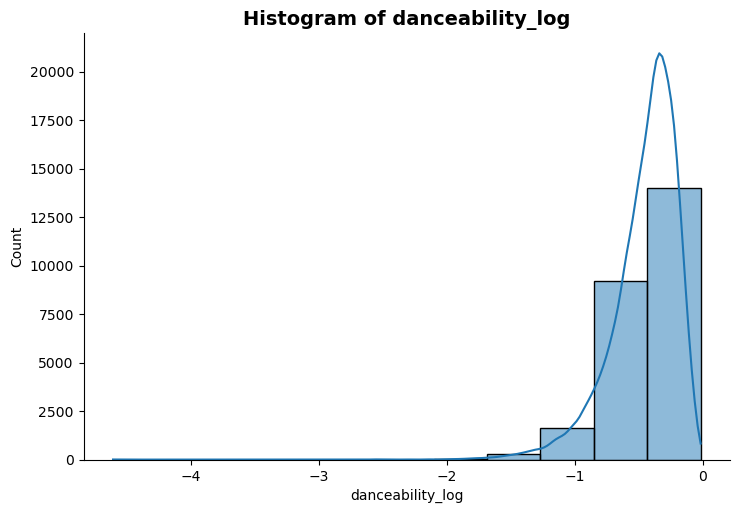

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


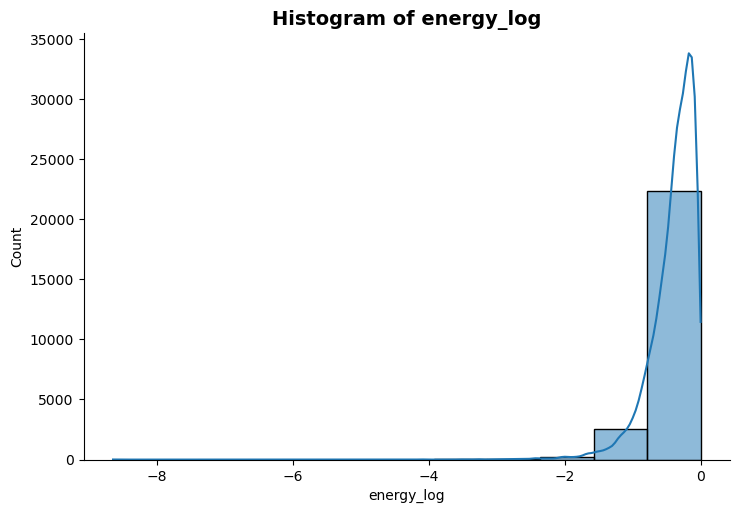

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


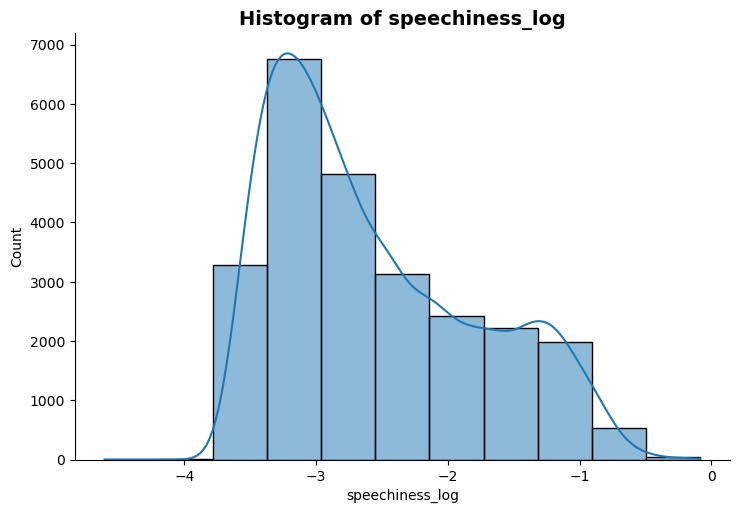

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


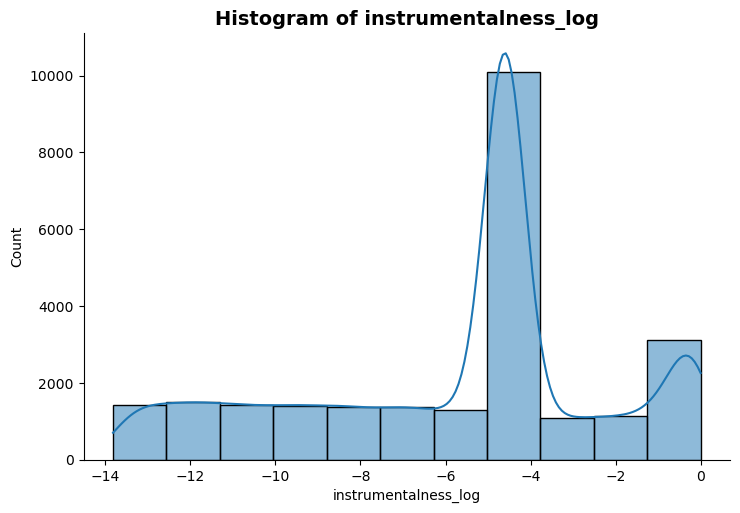

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


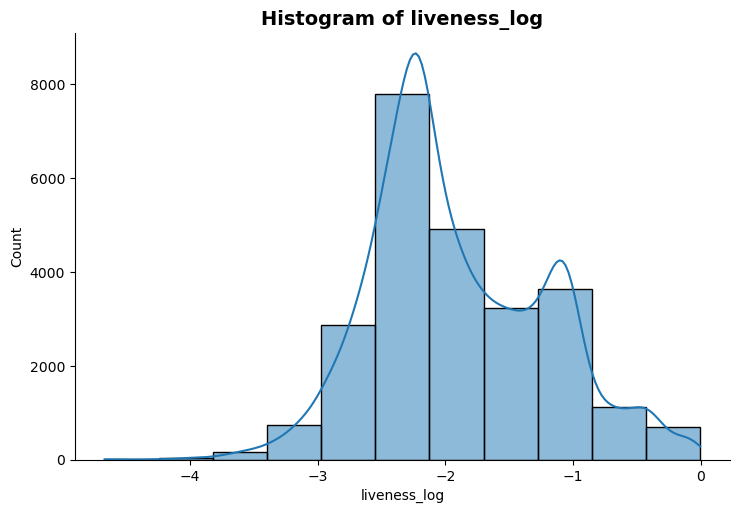

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


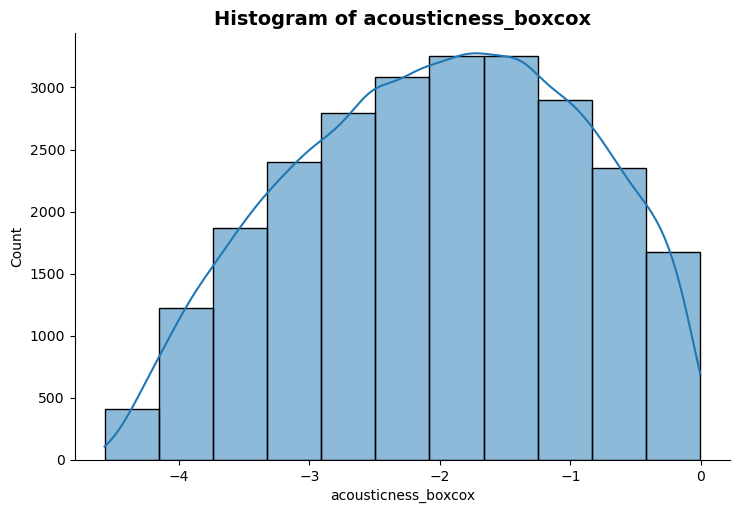

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


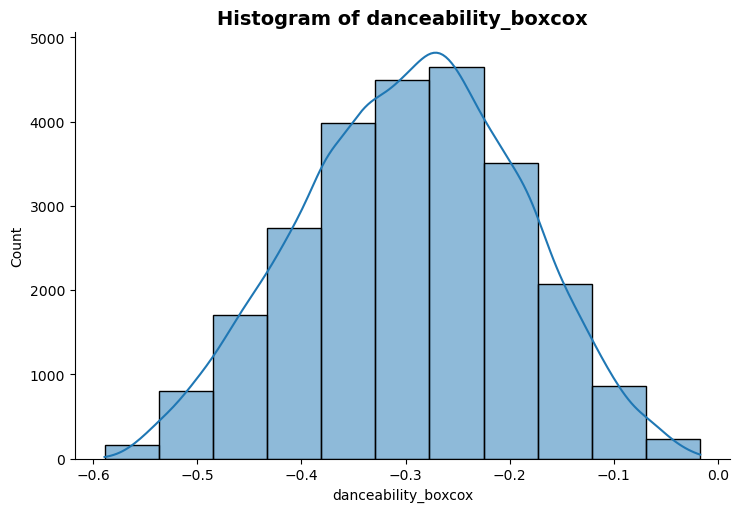

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


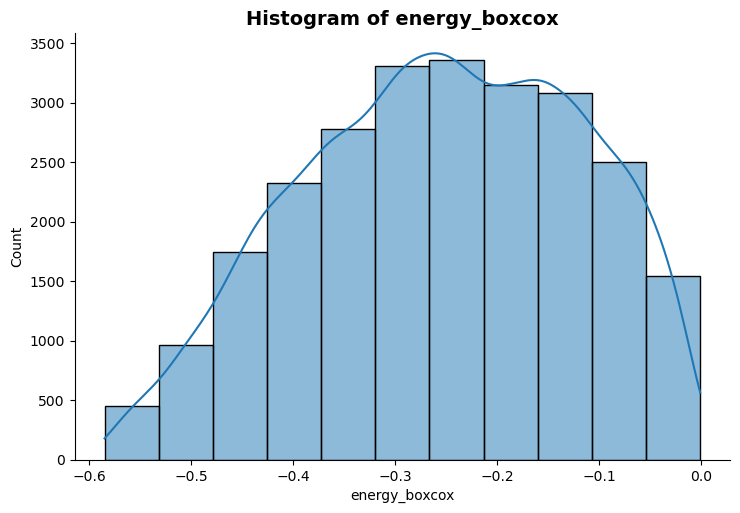

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


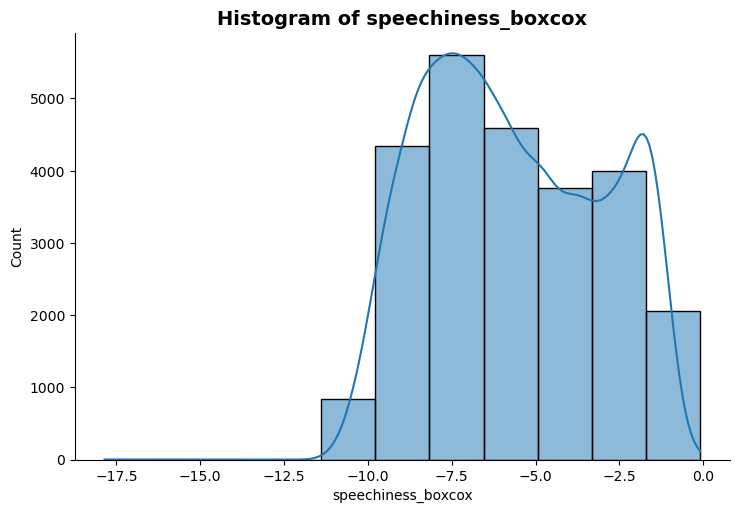

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


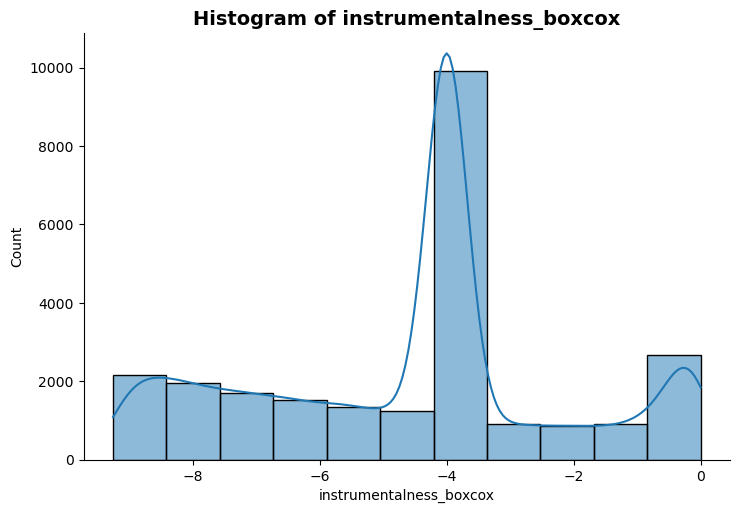

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


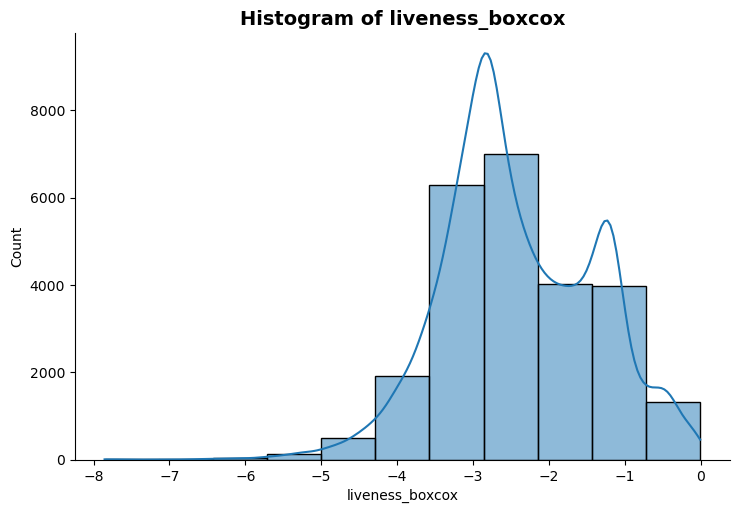

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


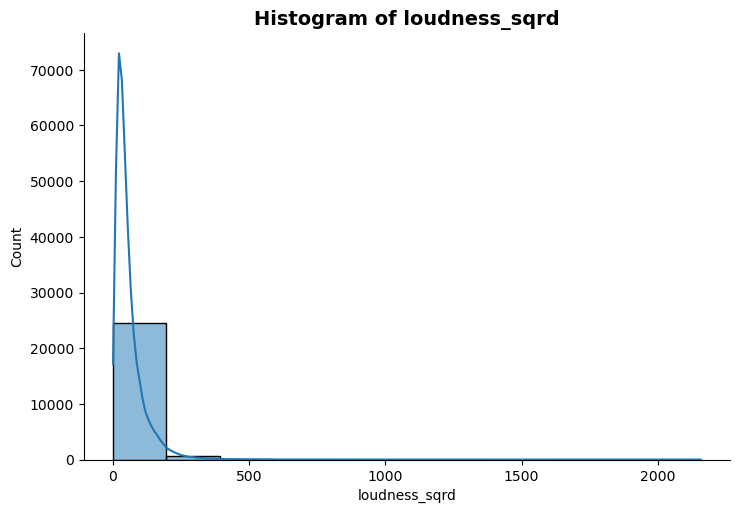

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


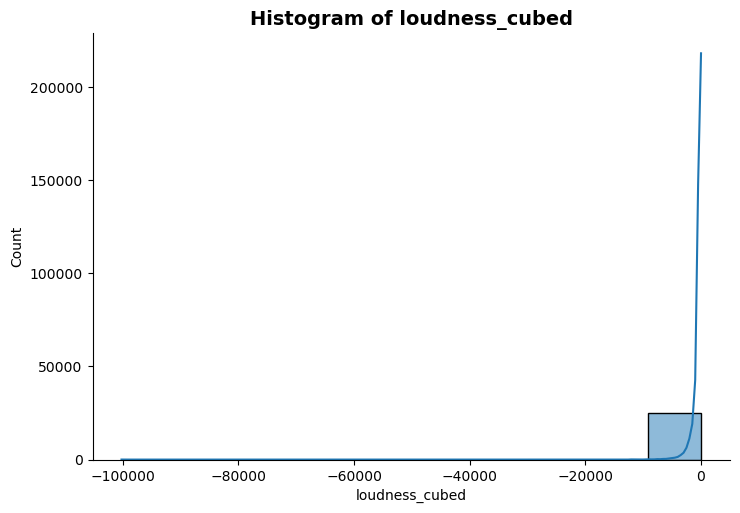

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


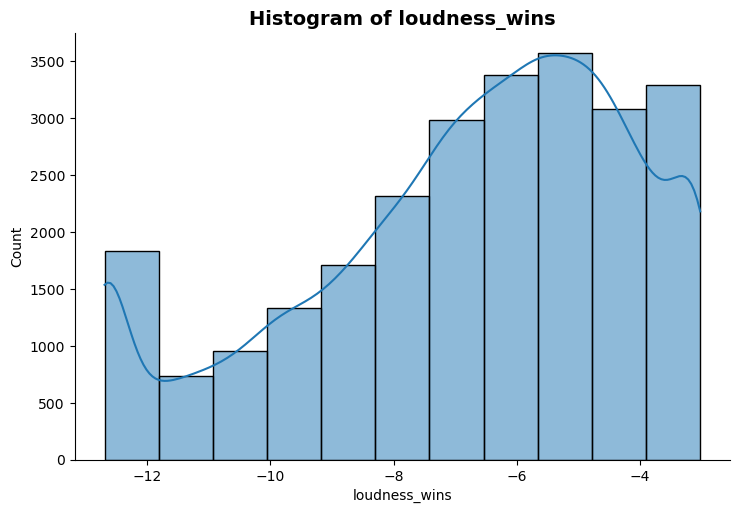

In [35]:
for varn in x_nums_std:
    sns.displot(data=spotify_transf, 
                x=varn, 
                kind="hist", 
                common_norm=False, 
                bins=11, 
                kde=True, 
                aspect=1.5)
    plt.title("Histogram of %s" % varn, fontsize=14, fontweight="bold")
    plt.show()

In [22]:
x_nums_with_std = ['acousticness_logit', 'danceability_boxcox', 'duration_ms',
              'energy_logit', 'speechiness_log',  'liveness_log', 
              'loudness',  'instrumentalness_logit', 'valence', 'tempo']

**STANDARDIZE DATA**

In [23]:
spotify_stan = spotify_transf.loc[:, x_nums_with_std].dropna().copy()

In [24]:
spotify_stan

,acousticness_logit,danceability_boxcox,duration_ms,energy_logit,speechiness_log,liveness_log,loudness,instrumentalness_logit,valence,tempo
3,-3.521738,-0.253422,169093,2.586689,-2.282782,-1.589635,-3.778,-11.571605,0.2770,121.956
4,-2.438278,-0.305607,189052,1.607040,-3.327018,-2.485307,-4.672,-4.595120,0.7250,123.976
6,-1.469622,-0.437889,187675,1.782457,-2.775794,-1.737271,-4.788,-4.595120,0.1520,112.648
10,-1.766325,-0.283794,207894,2.483824,-1.709258,-2.087474,-6.500,-12.222197,0.7520,121.984
12,-3.180661,-0.232522,192507,0.974422,-3.072613,-0.983499,-4.675,-4.595120,0.6870,121.985
...,...,...,...,...,...,...,...,...,...,...
32828,-2.489465,-0.449713,204375,2.469836,-2.368725,-2.706052,-1.814,-4.595120,0.2100,128.170
32829,-6.369550,-0.393774,353120,1.300981,-3.170086,-0.980829,-4.462,-5.451862,0.4000,128.041
32830,-2.111335,-0.389303,210112,1.523137,-3.034473,-1.897120,-4.899,-13.711149,0.4360,127.989
32831,-4.830413,-0.323154,367432,2.070473,-2.216407,-1.070025,-3.361,-1.927748,0.3080,128.008


/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


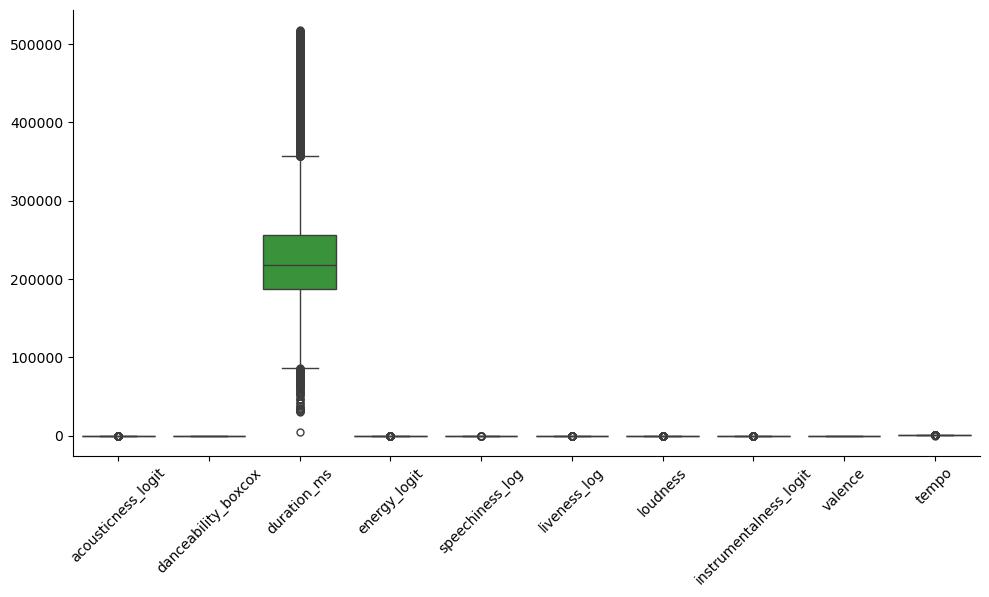

In [39]:
sns.catplot(data=pd.DataFrame(spotify_stan, columns=spotify_stan.columns), kind="box", aspect=2)
plt.xticks(rotation=45)
plt.show()

In [139]:
from sklearn.preprocessing import StandardScaler

In [140]:
Xspot = StandardScaler().fit_transform(spotify_stan)

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


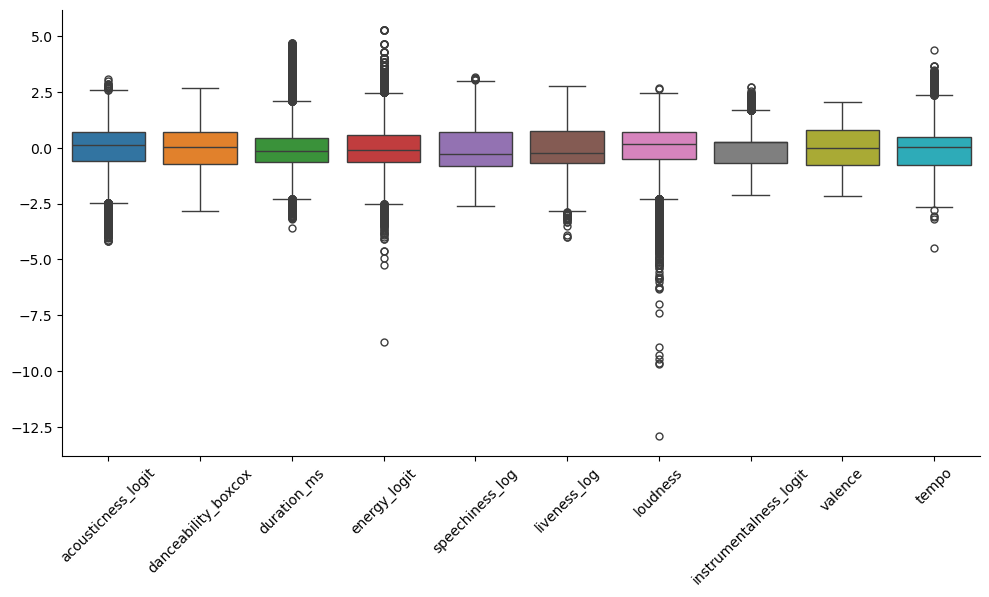

In [141]:
sns.catplot(data=pd.DataFrame(Xspot, columns=spotify_stan.columns), kind="box", aspect=2)
plt.xticks(rotation=45)
plt.show()

In [142]:
spotify_stan_clean = pd.DataFrame(Xspot, columns=spotify_stan.columns, index=spotify_stan.index)

In [143]:
spotify_stan_clean.describe()

,acousticness_logit,danceability_boxcox,duration_ms,energy_logit,speechiness_log,liveness_log,loudness,instrumentalness_logit,valence,tempo
count,2.519000e+04,2.519000e+04,2.519000e+04,2.519000e+04,2.519000e+04,2.519000e+04,2.519000e+04,2.519000e+04,2.519000e+04,2.519000e+04
mean,2.391982e-16,-2.183248e-16,-8.123712e-17,-1.579611e-17,-1.681157e-16,-1.308820e-16,1.669874e-16,3.610539e-16,1.083162e-16,3.430012e-16
std,1.000020e+00,1.000020e+00,1.000020e+00,1.000020e+00,1.000020e+00,1.000020e+00,1.000020e+00,1.000020e+00,1.000020e+00,1.000020e+00
min,-4.196641e+00,-2.819555e+00,-3.595264e+00,-8.718676e+00,-2.623323e+00,-3.995493e+00,-1.288977e+01,-2.092166e+00,-2.170119e+00,-4.481848e+00
25%,-5.755489e-01,-7.089355e-01,-6.341173e-01,-6.562079e-01,-8.146377e-01,-6.824039e-01,-4.938706e-01,-6.917839e-01,-7.754340e-01,-7.781583e-01
50%,1.335352e-01,3.531710e-02,-1.555877e-01,-8.132107e-02,-2.701178e-01,-2.239638e-01,1.796001e-01,2.583447e-01,6.950478e-03,3.751588e-02
75%,6.903271e-01,7.255849e-01,4.609243e-01,5.834592e-01,7.129566e-01,7.497682e-01,6.950097e-01,2.583447e-01,7.850829e-01,4.843992e-01
max,3.094850e+00,2.667356e+00,4.694323e+00,5.278645e+00,3.170180e+00,2.754740e+00,2.663115e+00,2.732420e+00,2.043701e+00,4.388396e+00


In [31]:
import statsmodels.formula.api as smf

In [65]:
formula_cesar = ["binary_outcome ~ acousticness_logit + danceability_boxcox + duration_ms + energy_logit + loudness + instrumentalness_logit + valence + tempo + playlist_genre",
                 "binary_outcome ~ (acousticness_logit + danceability_boxcox + duration_ms + energy_logit + loudness + instrumentalness_logit + valence + tempo)**2",
                 "binary_outcome ~ playlist_genre",
                 "binary_outcome ~ playlist_genre * (acousticness_logit + danceability_boxcox + duration_ms + energy_logit + loudness + instrumentalness_logit + valence + tempo)",
                ]

In [39]:
formula_cesar[0]

'binary_outcome ~ acousticness_logit + danceability_boxcox + duration_ms + energy_logit + instrumentalness_logit + valence + tempo + playlist_genre'

In [44]:
cesar = smf.logit(formula=formula_cesar[0],
                  data=spotify_transf).fit()

Optimization terminated successfully.
         Current function value: 0.599326
         Iterations 6


In [45]:
cesar.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:         binary_outcome   No. Observations:                25190
Model:                          Logit   Df Residuals:                    25176
Method:                           MLE   Df Model:                           13
Date:                Sun, 15 Dec 2024   Pseudo R-squ.:                 0.05273
Time:                        02:14:45   Log-Likelihood:                -15097.
converged:                       True   LL-Null:                       -15937.
Covariance Type:            nonrobust   LLR p-value:                     0.000
===========================================================================================
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                   0.2743      0.120      2.289      0.022       0.039       0.509
playlist_genre[T.latin]     0.9034      0.057     15.958      0.000       0.792       1.014
playlist_genre[T.pop]       1.1221      0.054     20.621      0.000       1.015       1.229
playlist_genre[T.r&b]       0.6911      0.058     11.906      0.000       0.577       0.805
playlist_genre[T.rap]       0.8843      0.053     16.595      0.000       0.780       0.989
playlist_genre[T.rock]      1.5037      0.059     25.511      0.000       1.388       1.619
acousticness_logit          0.0493      0.007      7.224      0.000       0.036       0.063
danceability_boxcox         0.9819      0.163      6.008      0.000       0.662       1.302
duration_ms             -2.838e-06   2.51e-07    -11.322      0.000   -3.33e-06   -2.35e-06
energy_logit               -0.2994      0.021    -14.329      0.000      -0.340      -0.258
loudness                    0.1223      0.007     18.381      0.000       0.109       0.135
instrumentalness_logit     -0.0155      0.004     -4.137      0.000      -0.023      -0.008
valence                    -0.2119      0.069     -3.070      0.002      -0.347      -0.077
tempo                       0.0030      0.001      5.726      0.000       0.002       0.004
===========================================================================================
"""

**Principal Component Analysis**

I did see some correlated variables so I decided that I would run a PCA to see which variables make up PC01 and PC02 aka which variables contribute/explain a lot of the variance.

In [45]:
from sklearn.decomposition import PCA

In [46]:
pca = PCA().fit(Xspot)

In [47]:
pca_spot = pca.transform(Xspot)

In [48]:
explained_variance_ratio = pca.explained_variance_ratio_

In [49]:
print(explained_variance_ratio)

[0.2120477  0.15604658 0.11289585 0.10538904 0.09742137 0.09243995
 0.08168602 0.06013526 0.05511222 0.02682601]


In [50]:
cumulative_variance = pca.explained_variance_ratio_.cumsum()

In [51]:
cumulative_variance

array([0.2120477 , 0.36809428, 0.48099013, 0.58637917, 0.68380054,
       0.77624049, 0.85792651, 0.91806177, 0.97317399, 1.        ])

In [52]:
loadings = pca.components_

In [53]:
loadings_df = pd.DataFrame(loadings, columns=spotify_stan_clean.columns, index=[f'PC{i+1}' for i in range(loadings.shape[0])])

In [54]:
loadings_df

,acousticness_logit,danceability_boxcox,duration_ms,energy_logit,speechiness_log,liveness_log,loudness,instrumentalness_logit,valence,tempo
PC1,0.494917,0.203675,-0.028674,-0.602317,0.002886,-0.180865,-0.509204,-0.053325,0.047277,-0.229953
PC2,-0.084832,-0.562977,0.269984,-0.156395,-0.420650,0.056301,-0.278041,0.189907,-0.522543,0.109414
PC3,-0.266361,0.279719,0.544776,0.099209,-0.313210,-0.514555,-0.027728,0.269150,0.261073,-0.199873
PC4,-0.097426,0.213955,-0.086404,-0.006351,0.455012,0.094584,-0.138370,0.800580,-0.247177,0.008484
PC5,0.024405,-0.044341,-0.121132,-0.070864,0.122485,-0.544957,-0.070001,-0.009696,0.048740,0.811414
PC6,-0.031942,-0.027635,-0.664532,0.045550,-0.302634,-0.469365,0.217542,0.116989,-0.271066,-0.328877
PC7,0.111566,-0.033938,-0.306478,0.038331,-0.512590,0.328550,-0.136773,0.387660,0.554293,0.209958
PC8,-0.749280,0.248212,-0.249888,-0.168463,-0.048108,0.121740,-0.448820,-0.257089,-0.020429,0.032542
PC9,-0.136979,-0.648609,-0.089833,0.126240,0.377851,-0.220743,-0.291345,0.041192,0.418410,-0.288777
PC10,0.270506,0.177114,-0.036362,0.741614,-0.059030,-0.040372,-0.535011,-0.125969,-0.192048,0.006554


Looking at the LOADINGS and CUMULATIVE VARIANCE from the PCA analysis, it seems that the:
* PC1 and PC2 explain 58% of the variance
* Certain variables have higher loadings within those two components:
  * Acousticness (0.49) in PC1
  * Energy (-0.60) in PC1
  * Danceability (0.20) in PC1, (-0.56) in PC2
  * Valence (-0.52) in PC1
 
I think these variables can explain a lot of variability and could be perfect for a predictor???? I didn't choose `loudness` because this variable is highly correlated with `energy`.

In [55]:
x_cluster = [ 'acousticness_logit', 'danceability_boxcox',  'energy_logit', 'valence']

## C. Clustering

In [56]:
from sklearn.cluster import KMeans

In [57]:
from scipy.cluster import hierarchy

In [58]:
clust_spot = spotify_stan_clean.loc[:, x_cluster].dropna().copy()

In order to find the optimal number of clusters, I plotted a Knee-Bend Curve AND I conducted a hierachy cluster using the ward method.

Plotting the Total Within Sum of Squares vs Number of Clusters to see whats the best clusters

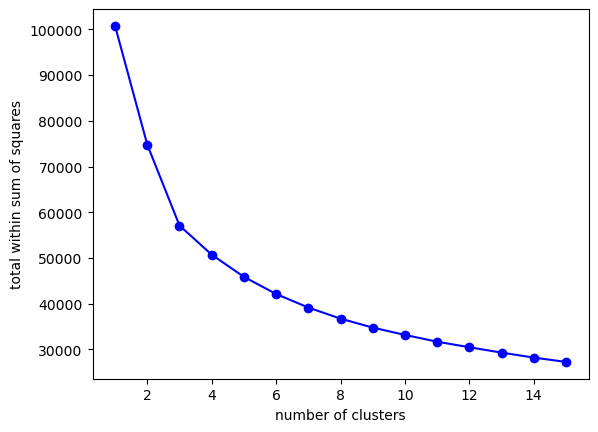

In [59]:
tots_within = []

K = range(1, 16)

for k in K:
    km = KMeans(n_clusters=k, random_state=2100, n_init=25, max_iter=500).fit(clust_spot)
    tots_within.append(km.inertia_)
    
Fig, ax = plt.subplots()
ax.plot(K, tots_within, "bo-")
ax.set_xlabel("number of clusters")
ax.set_ylabel("total within sum of squares")
plt.show()

Hierarchical Clustering

In [60]:
hclust_ward = hierarchy.ward(clust_spot)

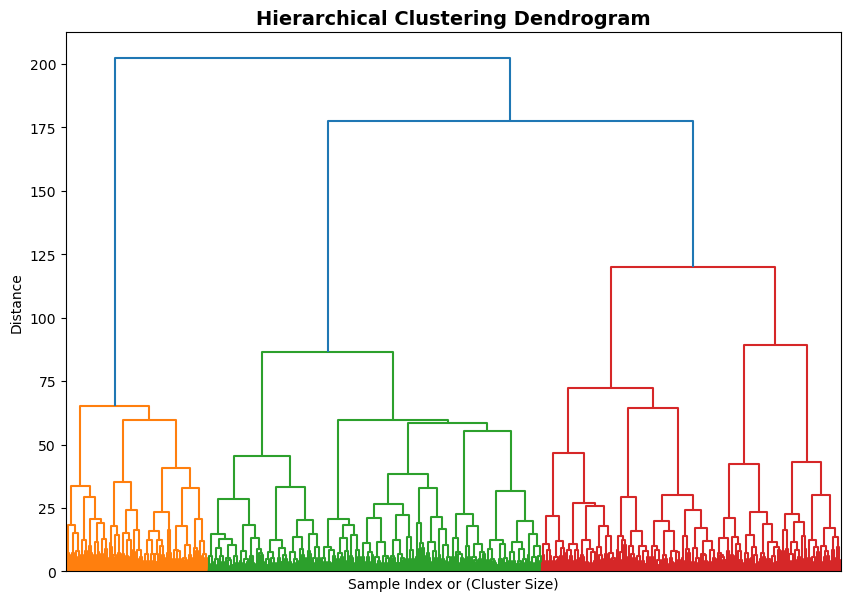

In [61]:
plt.figure(figsize=(10, 7))
dn = hierarchy.dendrogram(hclust_ward, no_labels=True)
plt.title("Hierarchical Clustering Dendrogram", fontsize=14, fontweight="bold")
plt.xlabel("Sample Index or (Cluster Size)")
plt.ylabel("Distance")
plt.show()

Based on both the plots, the best number of clusters is 3.

In [62]:
hclust_group = hierarchy.cut_tree(hclust_ward, height=150).ravel()

In [63]:
spotify_cluster = spotify_transf.dropna().copy()

In [64]:
spotify_cluster["hclustgroup"] = pd.Series(hclust_group, index=spotify_cluster.index).astype("category")

In [65]:
spotify_cluster.hclustgroup.value_counts(normalize=True)

hclustgroup
1    0.430687
2    0.385312
0    0.184002
Name: proportion, dtype: float64

Compare the cluster assignments to unique values of several of the categorical inputs

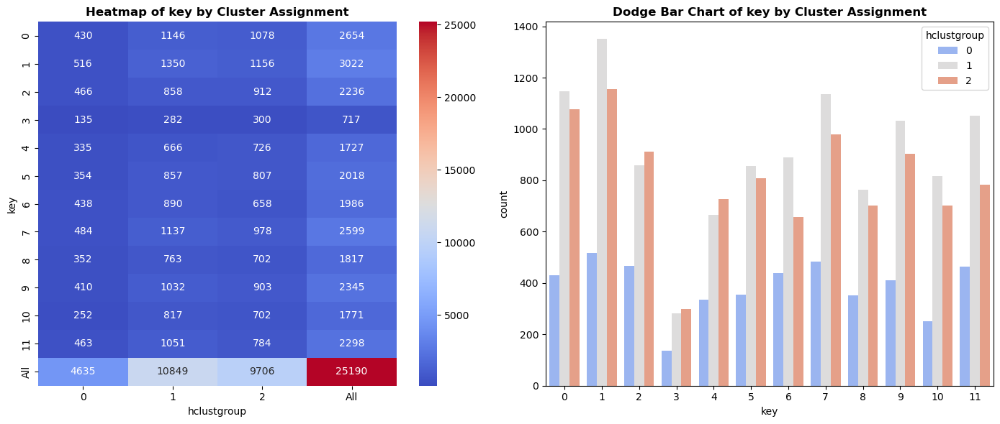

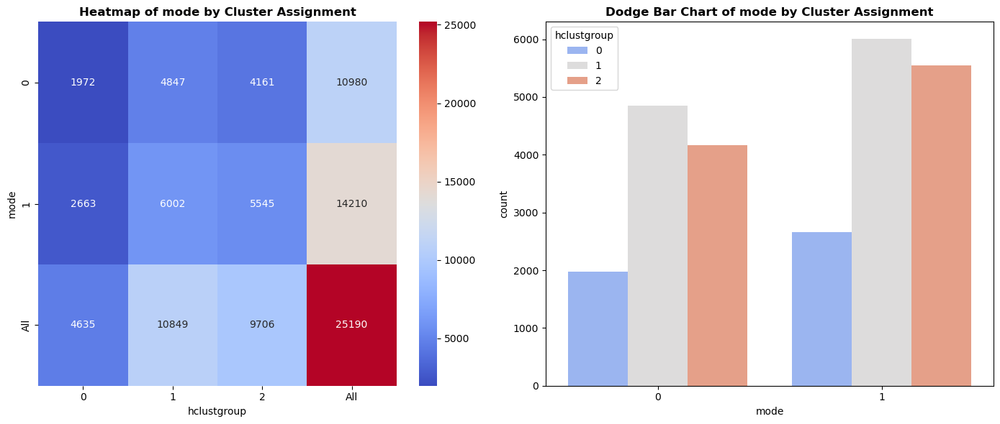

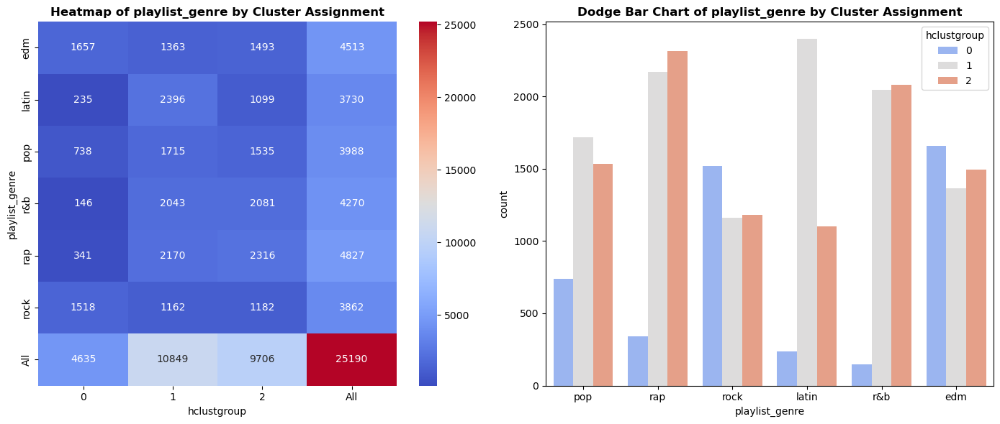

In [66]:
for var in x_cats:
    # Create subplots for heatmap and count plot
    fig, ax = plt.subplots(1, 2, figsize=(14, 6))
    
    # Heatmap of the contingency table
    sns.heatmap(data=pd.crosstab(spotify_cluster[var], spotify_cluster['hclustgroup'], margins=True), 
                ax=ax[0], annot=True, cmap='coolwarm', fmt='d')
    ax[0].set_title(f"Heatmap of {var} by Cluster Assignment", fontsize=12, fontweight="bold")
    
    # Count plot (Dodge Bar Chart)
    sns.countplot(data=spotify_cluster, x=var, hue='hclustgroup', palette="coolwarm", dodge=True, ax=ax[1])
    ax[1].set_title(f"Dodge Bar Chart of {var} by Cluster Assignment", fontsize=12, fontweight="bold")
    
    plt.tight_layout()
    plt.show()

Looking solely at our cluster assignments, we find that there are double the amount of songs in Clusters 1 and 2 compared to 0.\
In all three bar charts we see that Clusters 1 and 2 are represented more in each category. Within `playlist_genre`, we see that edm and rock are the only categories that have more from Cluster 0 than Cluster 1 or 2. 

Summarize the continuous inputs associated with each of the cluster assignments

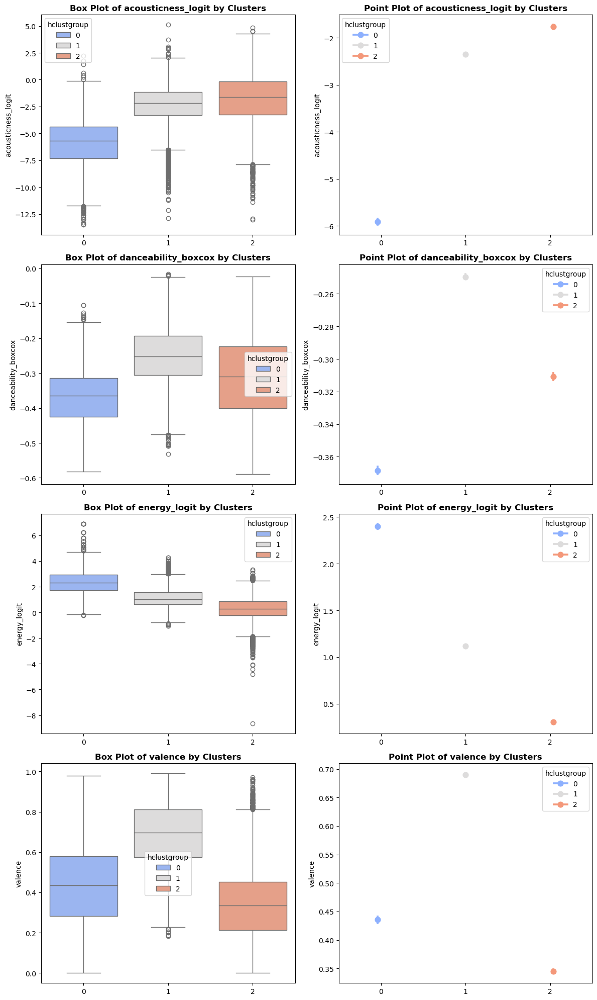

In [67]:
fig, axes = plt.subplots(len(x_cluster), 2, figsize=(12, 5 * len(x_cluster)))

if len(x_cluster) == 1:
    axes = axes.reshape(1, 2)

for i, var in enumerate(x_cluster):
    sns.boxplot(data=spotify_cluster, 
                x="hclustgroup", 
                y=spotify_cluster[var],
                hue="hclustgroup", 
                palette="coolwarm", 
                ax=axes[i, 0])
    axes[i, 0].set_title(f"Box Plot of {var} by Clusters", fontsize=12, fontweight="bold")
    axes[i, 0].set_xlabel("")  
    
    sns.pointplot(data=spotify_cluster, 
                  x="hclustgroup", 
                  y=spotify_cluster[var], 
                  hue="hclustgroup", 
                  palette="coolwarm", 
                  dodge=True, 
                  ax=axes[i, 1])
    axes[i, 1].set_title(f"Point Plot of {var} by Clusters", fontsize=12, fontweight="bold")
    axes[i, 1].set_xlabel("") 

plt.tight_layout()
plt.show()


In each of the continuous input variables, we find that BOTH the distributions and averages seems to have diferences between the Clusters.

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


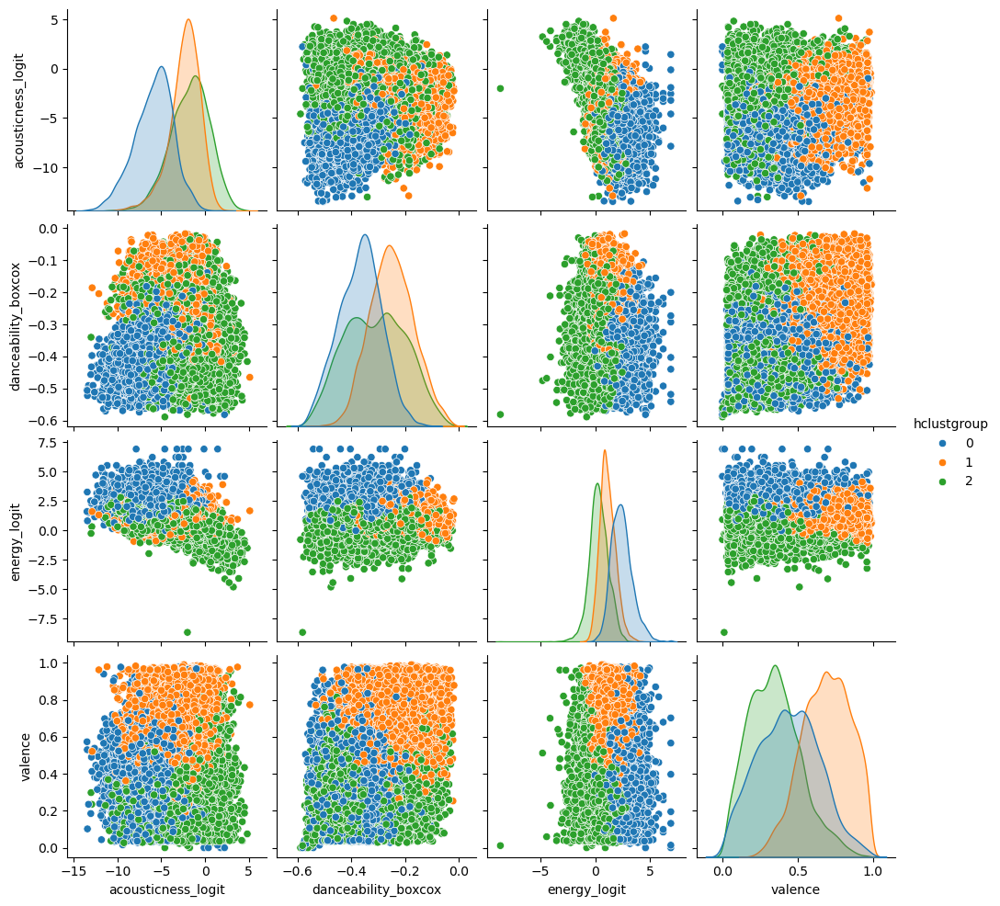

In [68]:
sns.pairplot(data=spotify_cluster.loc[:, ["hclustgroup"] + x_cluster], 
             hue="hclustgroup", 
             diag_kws={"common_norm":False})

plt.show()

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


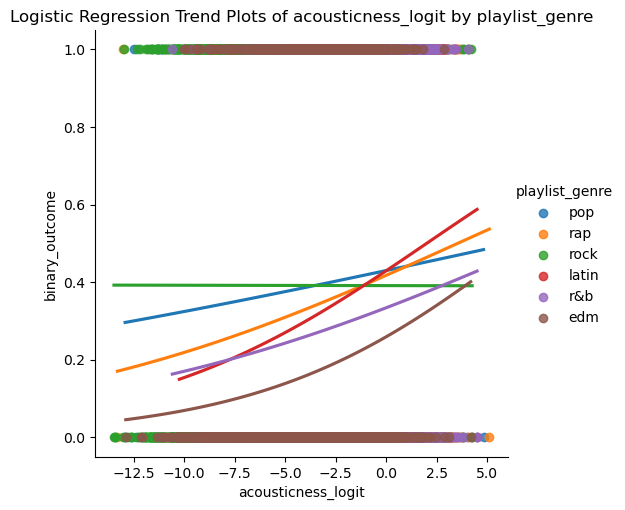

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


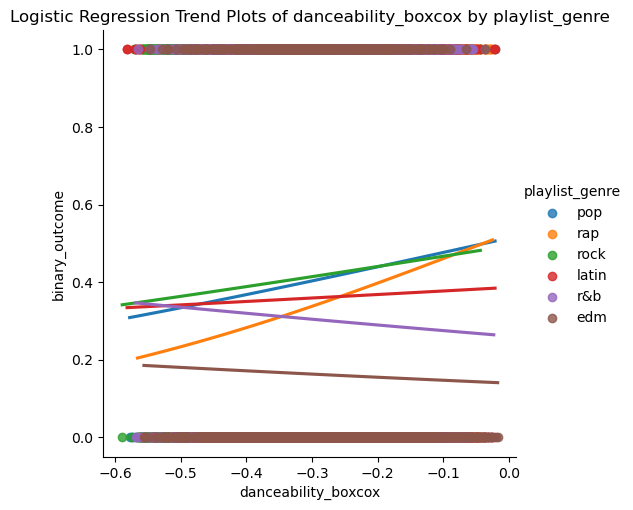

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


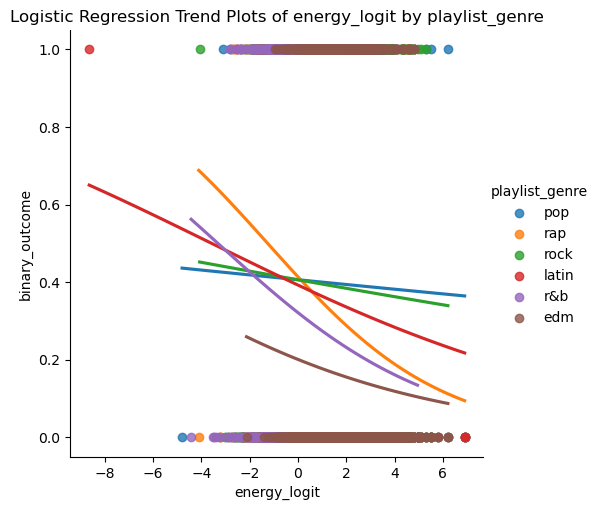

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


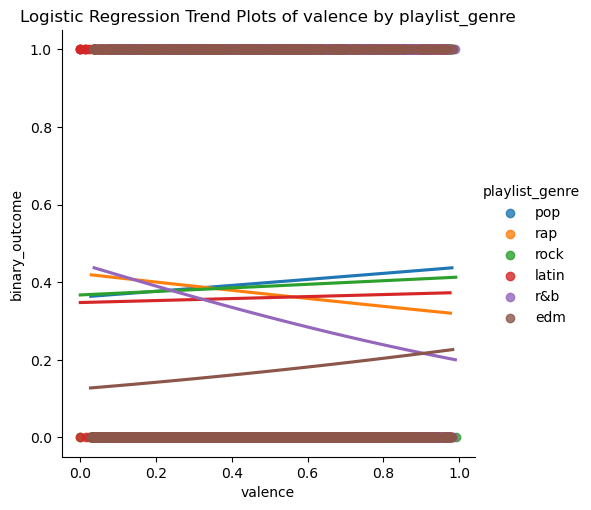

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


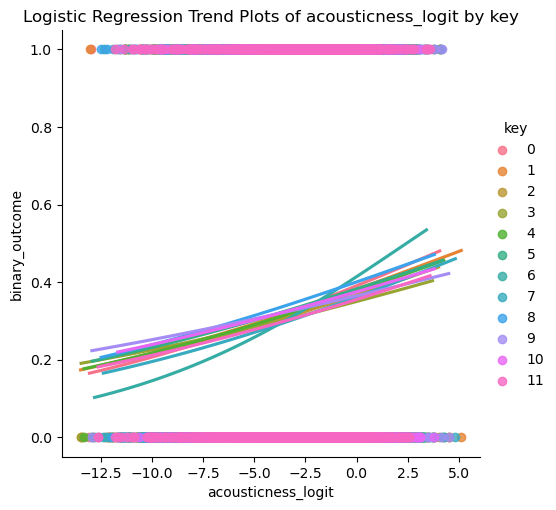

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


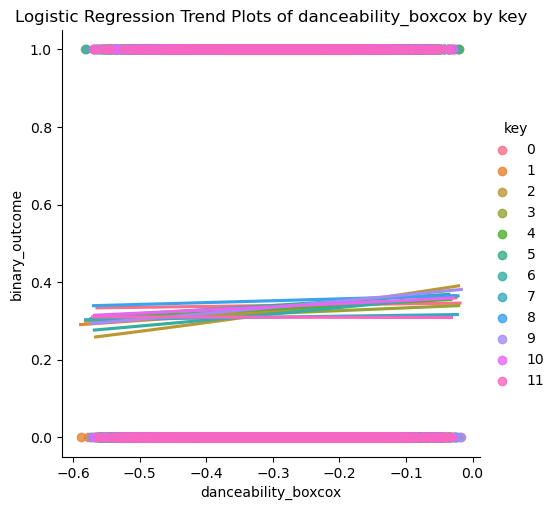

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


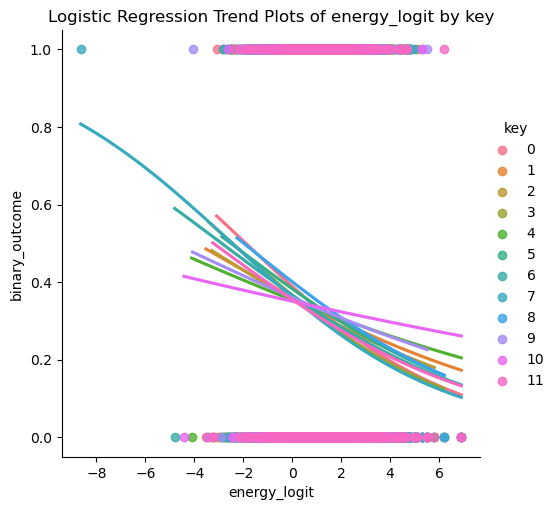

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


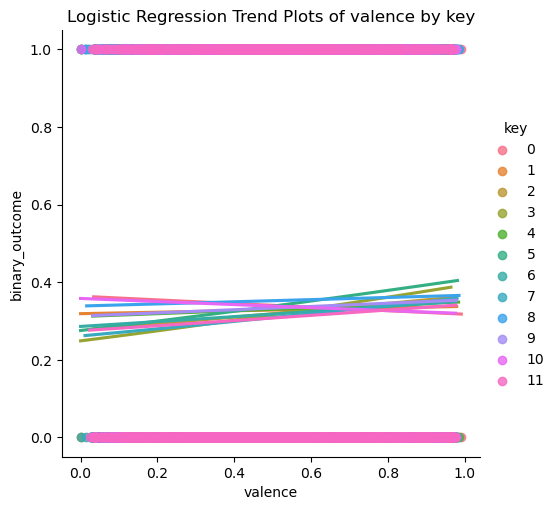

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


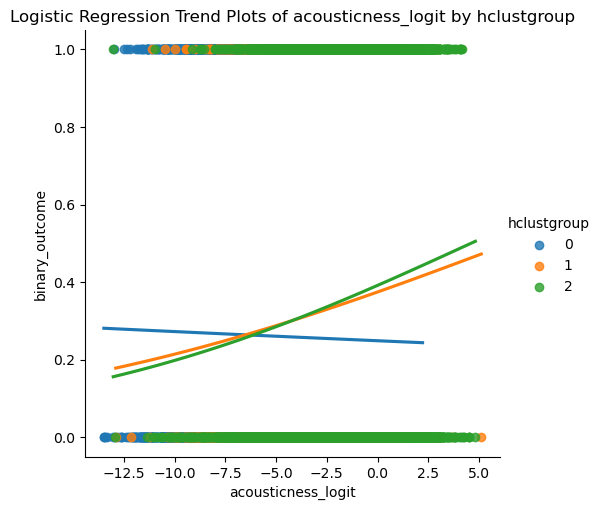

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


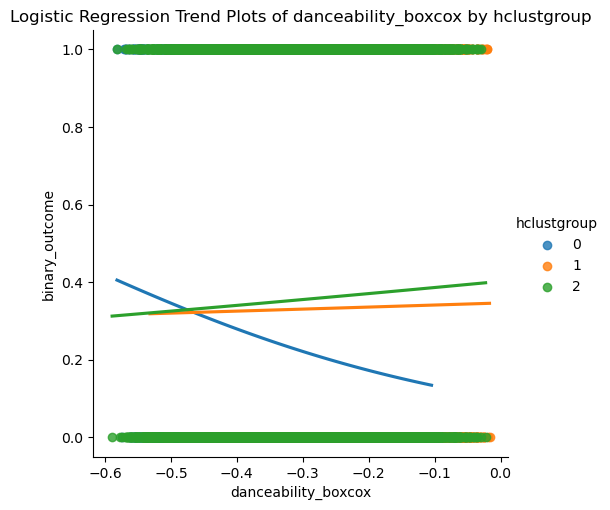

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


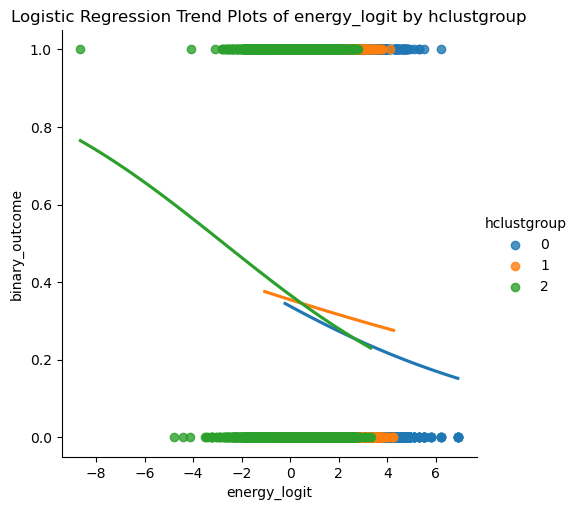

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


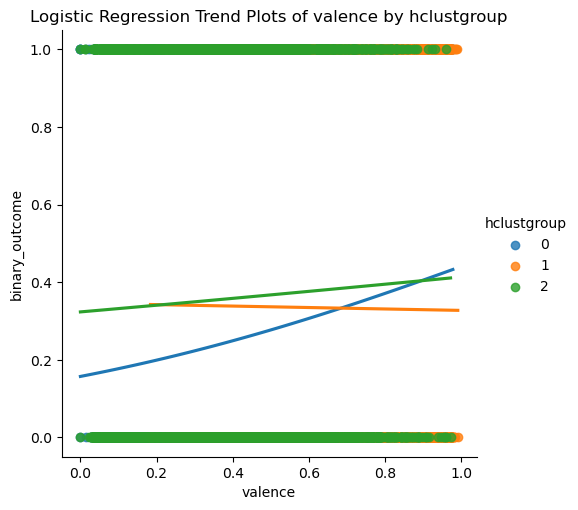

In [69]:
for var2 in ["playlist_genre", "key", "hclustgroup"]:
    for var in x_cluster:
        sns.lmplot(data=spotify_cluster, x=var, y="binary_outcome", hue=var2, logistic=True, ci=None)
        plt.title("Logistic Regression Trend Plots of "+ var + " by " + var2)
        plt.show()

Looking at both the PairPlots and the Logistic Regression trend plots, it is interesting to see that different genres and the cluster groups are showing different trends for the outcome. This makes me more comfortable in using these variables as predictors!

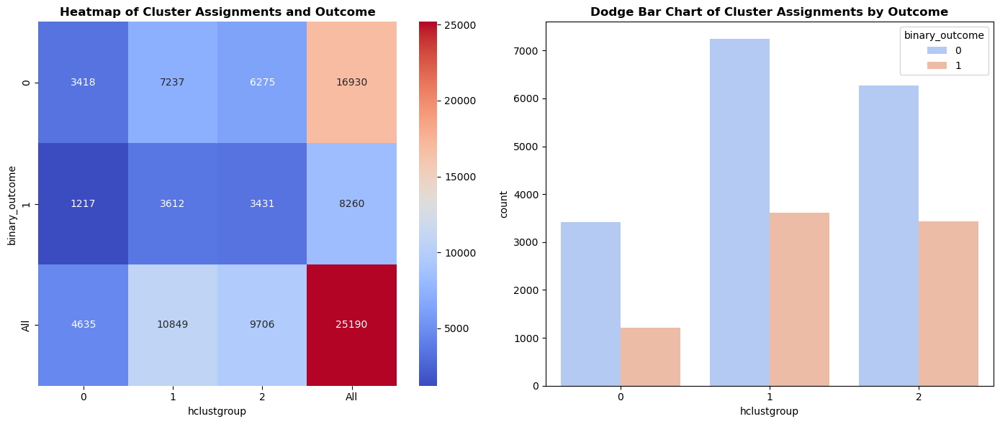

In [70]:
fig, ax = plt.subplots(1, 2, figsize=(14, 6))
sns.heatmap(data=pd.crosstab(spotify_cluster.binary_outcome, spotify_cluster.hclustgroup, margins=True), 
            annot=True,
            annot_kws={"fontsize": 10},
            cmap="coolwarm",
            fmt="d",
            ax=ax[0])
ax[0].set_title(f"Heatmap of Cluster Assignments and Outcome", fontsize=12, fontweight="bold")

# Count plot (Dodge Bar Chart)
sns.countplot(data=spotify_cluster, x="hclustgroup", hue='binary_outcome', palette="coolwarm", dodge=True, ax=ax[1])
ax[1].set_title(f"Dodge Bar Chart of Cluster Assignments by Outcome", fontsize=12, fontweight="bold")

plt.tight_layout()
plt.show()

In [71]:
spotify_cluster.hclustgroup.value_counts(normalize=True)

hclustgroup
1    0.430687
2    0.385312
0    0.184002
Name: proportion, dtype: float64

Comparing our clusters to the binary outcome, we see that each cluster group is dominated by the non-event compared to the event. This makes me think that maybe the binary outcome needs to be at a different threshold and not 50?

After the PCA and Cluster Analysis, I think I want to keep the following as inputs:
1. Continuous:
    * Danceability
    * Energy
    * Acousticness
    * Valence (unsure)
3. Categorical
    * Key
    * Playlist genre

## D. Models: Fitting and Interpretation

In [72]:
import statsmodels.formula.api as smf

In [53]:
from sklearn.model_selection import StratifiedKFold

In [54]:
from patsy import dmatrices, dmatrix

In [55]:
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV

In [56]:
from sklearn.metrics import confusion_matrix, roc_auc_score, roc_curve

In [57]:
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=2100)

In [73]:
formula_list = ["binary_outcome ~ 1", # intercept only
                "binary_outcome ~ playlist_genre + key", #categorical inputs with linear additive features
                "binary_outcome ~ acousticness_logit + danceability_boxcox + energy_logit + valence", # continuous inputs with linear additive features
                "binary_outcome ~ acousticness_logit + danceability_boxcox + energy_logit + valence +  playlist_genre + key", # cat and continuous with linear additive features
                "binary_outcome ~ (acousticness_logit + danceability_boxcox + energy_logit + valence)**2",
                "binary_outcome ~ (acousticness_logit + danceability_boxcox + energy_logit + valence) * (playlist_genre)",
                "binary_outcome ~ (playlist_genre + key) * (acousticness_logit + danceability_boxcox + energy_logit + valence)**2 + I(acousticness_logit**2) + I(danceability_boxcox**2) + I(energy_logit**2) + I(valence**2)",
                "binary_outcome ~ (playlist_genre + key) * (acousticness_logit + danceability_boxcox + energy_logit + np.power(acousticness_logit,2) + np.power(danceability_boxcox, 2) + np.power(energy_logit, 2) + np.power(acousticness_logit, 3) + np.power(danceability_boxcox, 3) + np.power(energy_logit, 3))"
                "binary_outcome ~ (playlist_genre + key) * (acousticness_logit + danceability_boxcox + energy_logit + np.power(acousticness_logit,2) + np.power(danceability_boxcox, 2) + np.power(energy_logit, 2) + np.power(acousticness_logit, 3) + np.power(danceability_boxcox, 3) + np.power(energy_logit, 3))",

               ]

In [183]:
formula_cesar = [
 'binary_outcome ~ acousticness_logit + danceability_boxcox + duration_ms + energy_logit + loudness + speechiness_log + liveness_log + instrumentalness_logit + valence + tempo + playlist_genre',
 'binary_outcome ~ (acousticness_logit + danceability_boxcox + duration_ms + energy_logit + loudness + speechiness_log + liveness_log + instrumentalness_logit + valence + tempo)**2',
 'binary_outcome ~ playlist_genre',
 'binary_outcome ~ playlist_genre * (acousticness_logit + danceability_boxcox + duration_ms + energy_logit + loudness + speechiness_log + liveness_log + instrumentalness_logit + valence + tempo)',
 'binary_outcome ~ playlist_genre * (acousticness_logit + danceability_boxcox + duration_ms + energy_logit + loudness + instrumentalness_logit + valence + tempo + speechiness_log + liveness_log + np.power(acousticness_logit, 2) + np.power(danceability_boxcox, 2) + np.power(duration_ms, 2) + np.power(energy_logit, 2) + np.power(loudness, 2) + np.power(instrumentalness_logit, 2) + np.power(valence, 2) + np.power(tempo, 2) + np.power(speechiness_log, 2) +np.power(liveness_log, 2) + np.power(acousticness_logit, 3) + np.power(danceability_boxcox, 3) + np.power(duration_ms, 3) + np.power(energy_logit, 3) + np.power(loudness, 3) + np.power(instrumentalness_logit, 3) + np.power(valence, 3) + np.power(tempo, 3) + np.power(speechiness_log, 3) + np.power(liveness_log, 3) )',
 'binary_outcome ~ playlist_genre * (acousticness_logit + danceability_boxcox + duration_ms + energy_logit + instrumentalness_logit + valence + tempo)',
 'binary_outcome ~ acousticness_logit + danceability_boxcox + duration_ms + energy_logit + loudness + instrumentalness_logit + valence + tempo + playlist_genre',
 'binary_outcome ~ playlist_genre * (acousticness_logit + danceability_boxcox + duration_ms + energy_logit + loudness + instrumentalness_logit + valence + tempo + np.power(acousticness_logit, 2) + np.power(danceability_boxcox, 2) + np.power(duration_ms, 2) + np.power(energy_logit, 2) + np.power(loudness, 2) + np.power(instrumentalness_logit, 2) + np.power(valence, 2) + np.power(tempo, 2) + np.power(acousticness_logit, 3) + np.power(danceability_boxcox, 3) + np.power(duration_ms, 3) + np.power(energy_logit, 3) + np.power(loudness, 3) + np.power(instrumentalness_logit, 3) + np.power(valence, 3) + np.power(tempo, 3))',
 'binary_outcome ~ acousticness_logit + danceability_boxcox + duration_ms + energy_logit + loudness + instrumentalness_logit + valence + tempo + (acousticness_logit + danceability_boxcox + duration_ms + energy_logit + loudness + instrumentalness_logit + valence + tempo)**3 + (acousticness_logit + danceability_boxcox + duration_ms + energy_logit + loudness  + instrumentalness_logit + valence + tempo)**2',
 'binary_outcome ~ (energy_logit + loudness)**2 + playlist_genre',
 'binary_outcome ~ (danceability_boxcox + valence)**2 + playlist_genre'







                ]

In [149]:
cesar = spotify_stan_clean.copy()
cesar["binary_outcome"] = pd.Series(spotify_transf.binary_outcome, index=spotify_transf.index)
cesar["playlist_genre"] = pd.Series(spotify_transf.playlist_genre, index=spotify_transf.index)
cesar["key"] = pd.Series(spotify_transf.key, index=spotify_transf.index)

Plots the coefs!!

In [47]:
def my_coefplot(mod, figsize_use=(10,4)):
    fig, ax = plt.subplots(figsize=figsize_use)

    ax.errorbar(y=mod.params.index,
               x=mod.params,
               xerr=2*mod.bse, fmt="o", color="k", ecolor="k", elinewidth=2, ms=10)

    ax.axvline(x=0, linestyle="--", linewidth=3.5, color="grey")

    ax.set_xlabel("coefficient value")

    plt.show()

Function to fit and assess logistic regressions!

In [48]:
def fit_and_assess_logistic(mod_name, a_formula, train_data,  threshold):
    a_mod = smf.logit(formula=a_formula, 
                      data=train_data).fit()
    my_coefplot(a_mod)
    train_copy = train_data.copy()
    
    train_copy["pred_probability"] = a_mod.predict(train_data)
    
    train_copy["pred_class"] = np.where(train_copy["pred_probability"] > threshold, 1, 0)

    TN, FP, FN, TP = confusion_matrix(train_copy.binary_outcome.to_numpy(), train_copy.pred_class.to_numpy()).ravel()

    Accuracy = (TN + TP)/(TN + TP + FN + FP)

    Sensitivity = TP/(TP + FN)

    Specificity = TN/(TN + FP)

    FPR = 1 - Specificity

    ROC_AUC = roc_auc_score(train_copy.binary_outcome.to_numpy(), train_copy.pred_probability.to_numpy())
    
    res_dict = {"model_name": mod_name,
               "model_formula": a_formula,
               "num_coefs": len(a_mod.params),
               "threshold": threshold,
               "Accuracy": Accuracy,
                "TN": TN,
                "FP": FP,
                "FN": FN,
                "TP": TP,
               "Sensitivity": Sensitivity,
               "Specificity": Specificity,
               "FPR": FPR,
               "ROC_AUC": ROC_AUC}
    
    return pd.DataFrame(res_dict, index=[0])

Gets the coefs in a DF.

In [49]:
def fit_and_coefs(mod_name, a_formula, train_data, threshold):
    a_mod = smf.logit(formula=a_formula, 
                      data=train_data).fit()
    
    coef_df = pd.DataFrame({
        'variable': a_mod.params.index,
        'coefficient': a_mod.params.values,
        'pvalue': a_mod.pvalues.values
    })
    
    coef_df['Model'] = mod_name  # Add model name for reference
    return coef_df

Optimization terminated successfully.
         Current function value: 0.599247
         Iterations 6


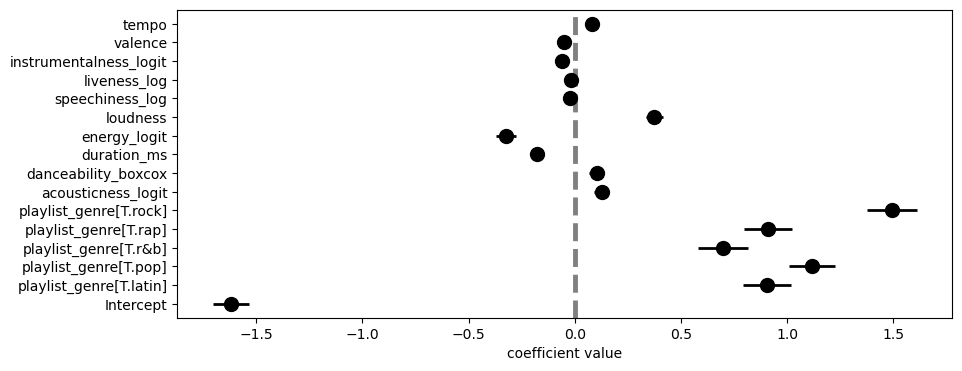

Optimization terminated successfully.
         Current function value: 0.599247
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.607549
         Iterations 6


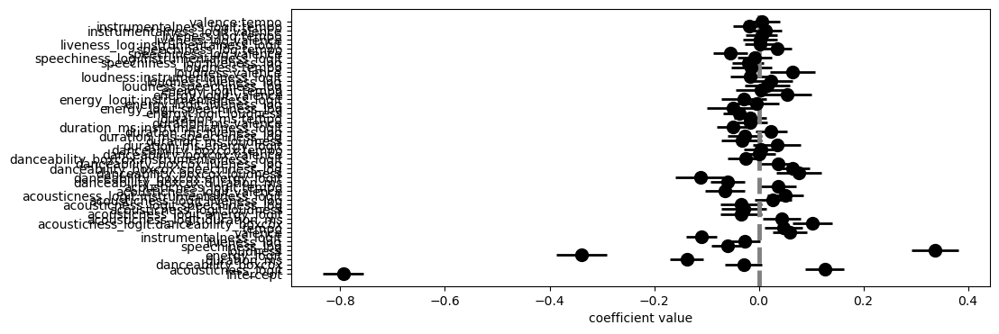

Optimization terminated successfully.
         Current function value: 0.607549
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.615544
         Iterations 6


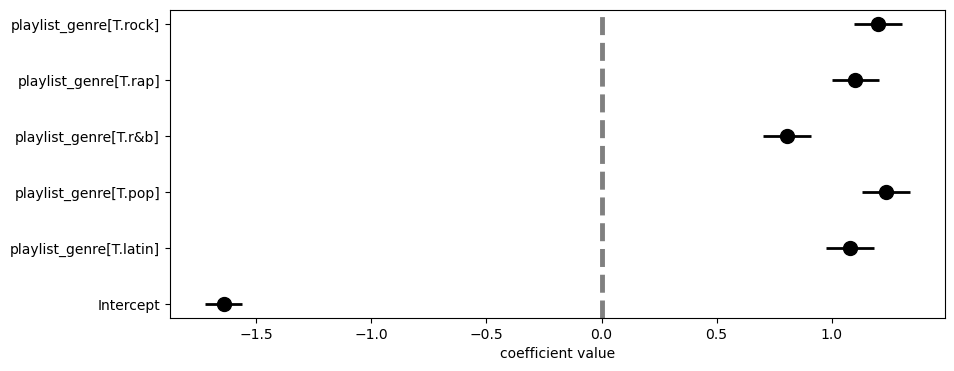

Optimization terminated successfully.
         Current function value: 0.615544
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.592476
         Iterations 6


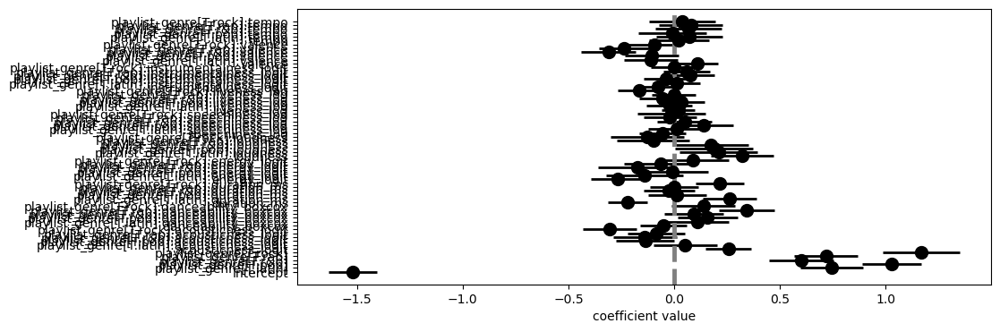

Optimization terminated successfully.
         Current function value: 0.592476
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584976
         Iterations 7


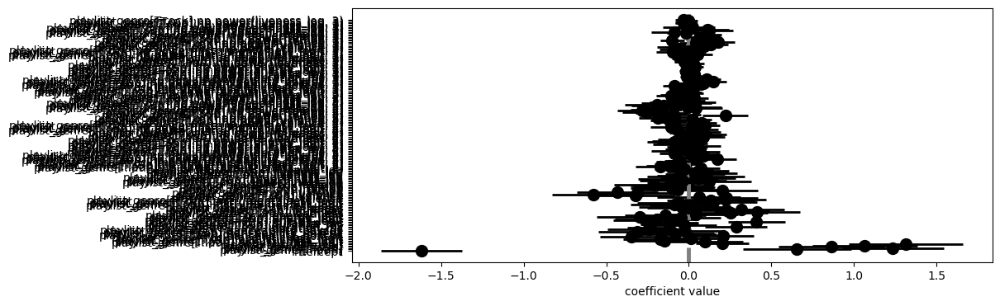

Optimization terminated successfully.
         Current function value: 0.584976
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.600645
         Iterations 6


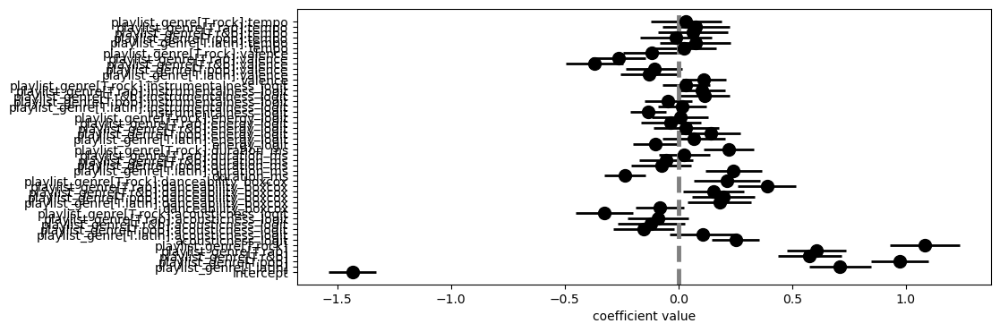

Optimization terminated successfully.
         Current function value: 0.600645
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.599326
         Iterations 6


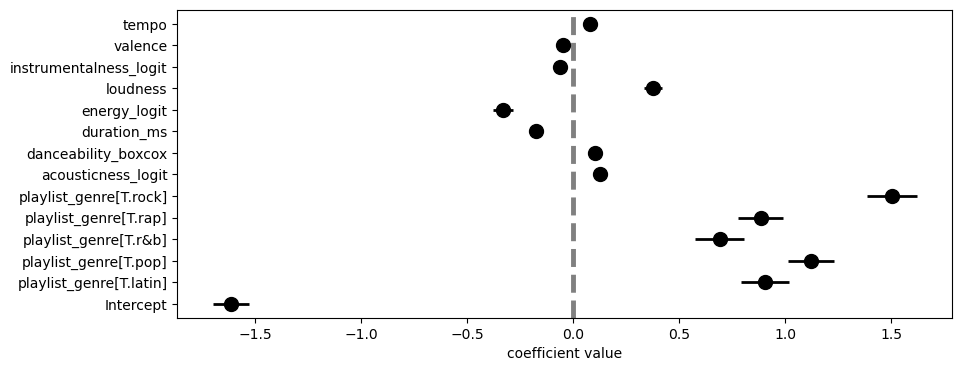

Optimization terminated successfully.
         Current function value: 0.599326
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.586598
         Iterations 7


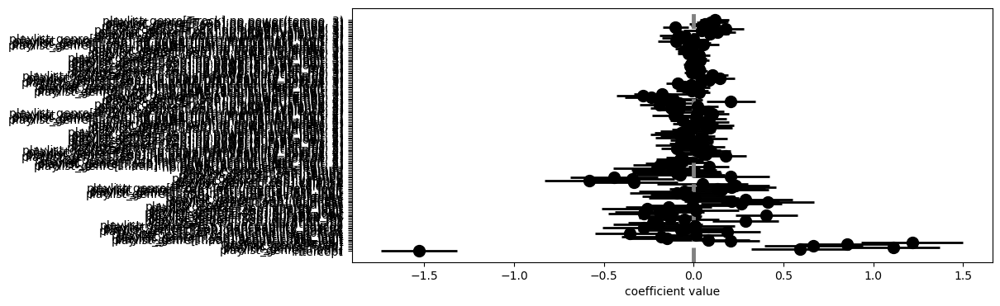

Optimization terminated successfully.
         Current function value: 0.586598
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.606553
         Iterations 7


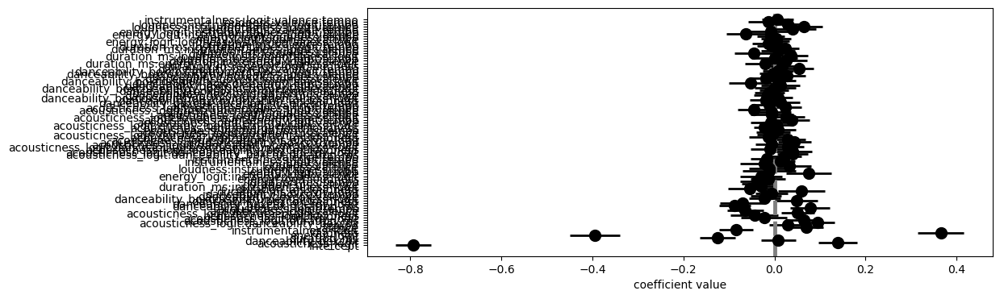

Optimization terminated successfully.
         Current function value: 0.606553
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.604459
         Iterations 6


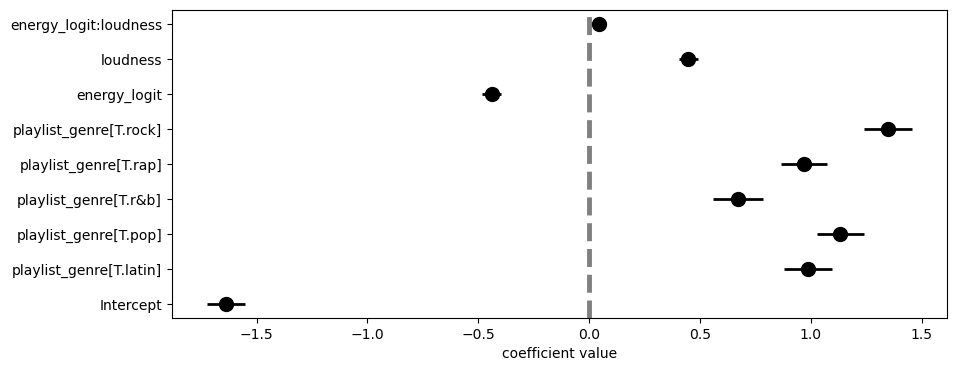

Optimization terminated successfully.
         Current function value: 0.604459
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.614435
         Iterations 6


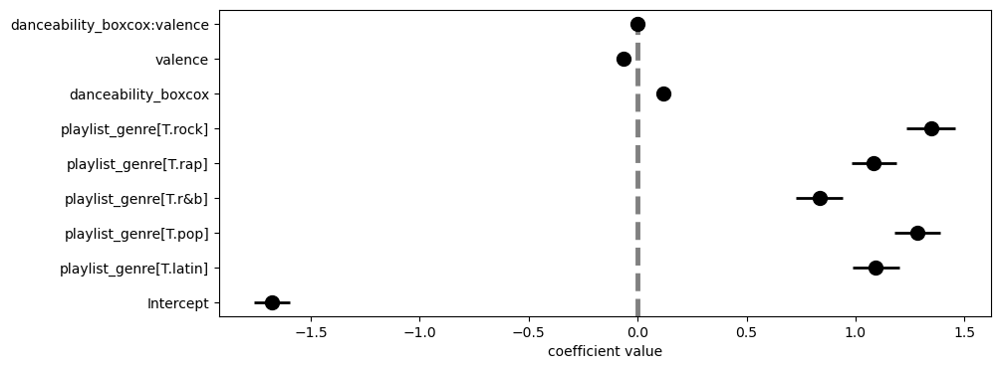

Optimization terminated successfully.
         Current function value: 0.614435
         Iterations 6


In [184]:
results_list = []
coefs_list = []

for m in range(len(formula_cesar)):
    results_list.append(fit_and_assess_logistic(m, formula_cesar[m], train_data=cesar, threshold=0.5))
    coefs_list.append(fit_and_coefs(m, formula_cesar[m], train_data=cesar, threshold=0.5))

In [137]:
cesar = smf.logit(formula=formula_cesar[0], data=spotify_transf).fit()

Optimization terminated successfully.
         Current function value: 0.599247
         Iterations 6


In [138]:
cesar.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:         binary_outcome   No. Observations:                25190
Model:                          Logit   Df Residuals:                    25174
Method:                           MLE   Df Model:                           15
Date:                Sun, 15 Dec 2024   Pseudo R-squ.:                 0.05285
Time:                        02:35:56   Log-Likelihood:                -15095.
converged:                       True   LL-Null:                       -15937.
Covariance Type:            nonrobust   LLR p-value:                     0.000
===========================================================================================
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                   0.1359      0.139      0.981      0.327      -0.136       0.408
playlist_genre[T.latin]     0.9049      0.057     15.975      0.000       0.794       1.016
playlist_genre[T.pop]       1.1160      0.054     20.477      0.000       1.009       1.223
playlist_genre[T.r&b]       0.6995      0.058     11.977      0.000       0.585       0.814
playlist_genre[T.rap]       0.9107      0.056     16.307      0.000       0.801       1.020
playlist_genre[T.rock]      1.4939      0.059     25.243      0.000       1.378       1.610
acousticness_logit          0.0499      0.007      7.296      0.000       0.036       0.063
danceability_boxcox         0.9874      0.166      5.939      0.000       0.662       1.313
duration_ms              -2.87e-06   2.51e-07    -11.414      0.000   -3.36e-06   -2.38e-06
energy_logit               -0.2922      0.021    -13.788      0.000      -0.334      -0.251
loudness                    0.1219      0.007     18.326      0.000       0.109       0.135
speechiness_log            -0.0307      0.021     -1.486      0.137      -0.071       0.010
liveness_log               -0.0256      0.021     -1.218      0.223      -0.067       0.016
instrumentalness_logit     -0.0157      0.004     -4.186      0.000      -0.023      -0.008
valence                    -0.2121      0.069     -3.074      0.002      -0.347      -0.077
tempo                       0.0030      0.001      5.794      0.000       0.002       0.004
===========================================================================================
"""

In [187]:
coefs_df = pd.concat(coefs_list, ignore_index=True)

In [188]:
pvalsig = coefs_df.loc[(coefs_df.pvalue < 0.05)]

In [189]:
pvalsig.loc[pvalsig.Model == 10]

,variable,coefficient,pvalue,Model
644,Intercept,-1.677878,0.000000e+00,10
645,playlist_genre[T.latin],1.093619,3.676155e-90,10
646,playlist_genre[T.pop],1.285449,1.450995e-132,10
647,playlist_genre[T.r&b],0.833929,1.570939e-55,10
648,playlist_genre[T.rap],1.084605,2.558396e-101,10
649,playlist_genre[T.rock],1.347458,8.811968e-128,10
650,danceability_boxcox,0.119140,3.594278e-13,10
651,valence,-0.063418,3.177681e-05,10


In [123]:
pvalsig.groupby("Model").aggregate(coefficient = ("coefficient", "max")).merge(coefs_df, on=["coefficient"], how="inner")

,coefficient,variable,pvalue,Model
0,1.503707,playlist_genre[T.rock],1.505615e-143,0
1,5.207793,danceability_boxcox,1.037083e-06,1
2,1.235244,playlist_genre[T.pop],4.925119e-126,2
3,3.332519,playlist_genre[T.rap]:danceability_boxcox,5.826475e-08,3
4,126.972408,playlist_genre[T.r&b]:np.power(danceability_bo...,5.126321e-04,4
5,3.731055,playlist_genre[T.rap]:danceability_boxcox,1.039531e-09,5


In [185]:
results_df = pd.concat(results_list, ignore_index=True)

In [186]:
results_df.sort_values(by=["Accuracy"], ascending=False)

,model_name,model_formula,num_coefs,threshold,Accuracy,TN,FP,FN,TP,Sensitivity,Specificity,FPR,ROC_AUC
4,4,binary_outcome ~ playlist_genre * (acousticnes...,186,0.5,0.685073,15715,1215,6718,1542,0.186683,0.928234,0.071766,0.684381
7,7,binary_outcome ~ playlist_genre * (acousticnes...,150,0.5,0.684518,15798,1132,6815,1445,0.174939,0.933136,0.066864,0.680791
3,3,binary_outcome ~ playlist_genre * (acousticnes...,66,0.5,0.678126,16011,919,7189,1071,0.129661,0.945718,0.054282,0.671422
8,8,binary_outcome ~ acousticness_logit + danceabi...,93,0.5,0.675744,16469,461,7707,553,0.066949,0.972770,0.027230,0.633731
1,1,binary_outcome ~ (acousticness_logit + danceab...,56,0.5,0.673998,16483,447,7765,495,0.059927,0.973597,0.026403,0.632107
2,2,binary_outcome ~ playlist_genre,6,0.5,0.672092,16930,0,8260,0,0.000000,1.000000,0.000000,0.594804
10,10,binary_outcome ~ (danceability_boxcox + valenc...,9,0.5,0.672092,16930,0,8260,0,0.000000,1.000000,0.000000,0.607792
5,5,binary_outcome ~ playlist_genre * (acousticnes...,48,0.5,0.671735,16384,546,7723,537,0.065012,0.967750,0.032250,0.647420
6,6,binary_outcome ~ acousticness_logit + danceabi...,14,0.5,0.670782,16196,734,7559,701,0.084867,0.956645,0.043355,0.654524
9,9,binary_outcome ~ (energy_logit + loudness)**2 ...,9,0.5,0.670703,16547,383,7912,348,0.042131,0.977377,0.022623,0.642666


The highest model that I had was the most complicated model with 191 coefficients, followed by a model with 170 coefficients and then another model at 30 coefficients. This shows me that I might not have the correct predictors, or there may need to be an interaction that is important to determine popularity.

In [97]:
def fit_logistic_make_roc(mod_name, a_formula, train_data):
    a_mod = smf.logit(formula=a_formula, data=train_data).fit()

    train_copy = train_data.copy()

    train_copy["pred_probability"] = a_mod.predict(train_data)

    fpr, tpr, threshold = roc_curve(train_copy.binary_outcome.to_numpy(), train_copy.pred_probability.to_numpy())

    res_df = pd.DataFrame({"tpr": tpr,
                          "fpr": fpr,
                          "threshold": threshold})
    res_df["model_name"] = str(mod_name)
    res_df["model_formula"] = a_formula

    return res_df

In [99]:
roc_list = []

for m in range(len(formula_list)):
    roc_list.append(fit_logistic_make_roc(m, formula_list[m], train_data=spotify_transf))

Optimization terminated successfully.
         Current function value: 0.632687
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.615152
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.626910
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611321
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.623238
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606362
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.600537
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.603203
         Iterations 9


In [100]:
roc_df = pd.concat(roc_list, ignore_index=True)

In [101]:
roc_df

,tpr,fpr,threshold,model_name,model_formula
0,0.000000,0.000000,inf,0,binary_outcome ~ 1
1,1.000000,1.000000,0.327908,0,binary_outcome ~ 1
2,0.000000,0.000000,inf,1,binary_outcome ~ playlist_genre + key
3,0.014891,0.009628,0.429886,1,binary_outcome ~ playlist_genre + key
4,0.026392,0.017602,0.423555,1,binary_outcome ~ playlist_genre + key
...,...,...,...,...,...
65364,1.000000,0.994979,0.053303,7,binary_outcome ~ (playlist_genre + key) * (aco...
65365,1.000000,0.995097,0.053195,7,binary_outcome ~ (playlist_genre + key) * (aco...
65366,1.000000,0.997519,0.037032,7,binary_outcome ~ (playlist_genre + key) * (aco...
65367,1.000000,0.997637,0.036295,7,binary_outcome ~ (playlist_genre + key) * (aco...


/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


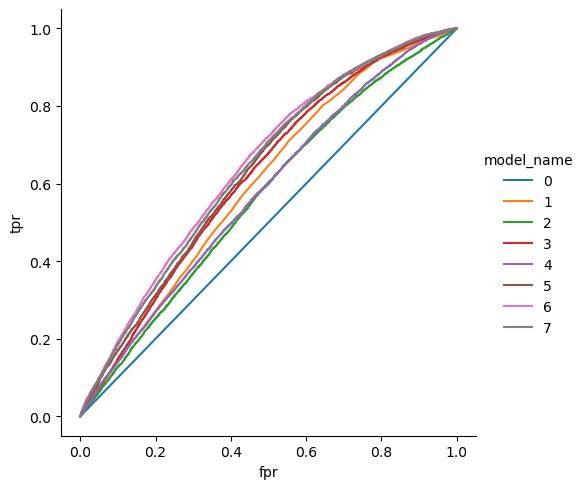

In [102]:
sns.relplot(data=roc_df, x="fpr", y="tpr", hue="model_name",
            kind="line", estimator=None, units="model_name")

plt.show()

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


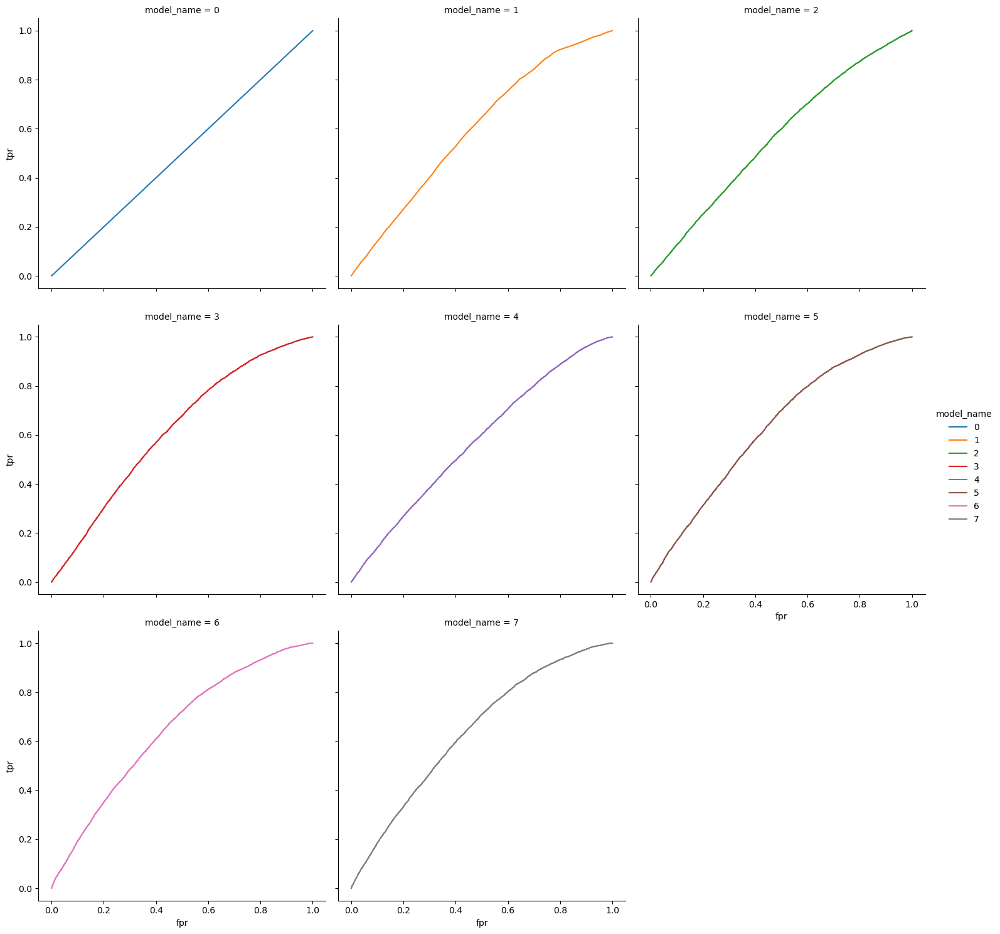

In [94]:
sns.relplot(data=roc_df, x="fpr", y="tpr", col="model_name", col_wrap=3, hue="model_name",
            kind="line", estimator=None, units="model_name")

plt.show()

**Model 0**

In [95]:
results_df.loc[results_df.model_name == 0]

,model_name,model_formula,num_coefs,threshold,Accuracy,TN,FP,FN,TP,Sensitivity,Specificity,FPR,ROC_AUC
0,0,binary_outcome ~ 1,1,0.5,0.672092,16930,0,8260,0,0.0,1.0,0.0,0.5


In [96]:
pvalsig.loc[pvalsig.Model == 0]

,variable,coefficient,pvalue,Model
0,Intercept,-0.717663,0.0,0


Model 0 was the intercept-only model but this coefficient was significant.

**Model 1**

In [97]:
results_df.loc[results_df.model_name == 1]

,model_name,model_formula,num_coefs,threshold,Accuracy,TN,FP,FN,TP,Sensitivity,Specificity,FPR,ROC_AUC
1,1,binary_outcome ~ playlist_genre + key,17,0.5,0.672092,16930,0,8260,0,0.0,1.0,0.0,0.598879


In [98]:
pvalsig.loc[pvalsig.Model == 1].sort_values(by=["coefficient"], ascending=False)

,variable,coefficient,pvalue,Model
3,playlist_genre[T.pop],1.235155,8.819051e-126,1
6,playlist_genre[T.rock],1.209273,7.881096e-118,1
5,playlist_genre[T.rap],1.102840,1.726152e-106,1
2,playlist_genre[T.latin],1.080490,7.842475e-93,1
4,playlist_genre[T.r&b],0.802594,5.787204e-53,1
13,key[T.7],-0.124044,3.855562e-02,1
1,Intercept,-1.606088,1.984299e-177,1


of the 17 coefficients, all the genres were significant and only key=7 was significant. The highest was pop at 1.23.

**Model 2**

In [99]:
results_df.loc[results_df.model_name == 2]

,model_name,model_formula,num_coefs,threshold,Accuracy,TN,FP,FN,TP,Sensitivity,Specificity,FPR,ROC_AUC
2,2,binary_outcome ~ acousticness_logit + danceabi...,5,0.5,0.671894,16920,10,8255,5,0.000605,0.999409,0.000591,0.56547


In [100]:
pvalsig.loc[pvalsig.Model == 2].sort_values(by=["coefficient"], ascending=False)

,variable,coefficient,pvalue,Model
22,valence,0.228683,2.549064e-04,2
19,acousticness_logit,0.052590,3.059222e-16,2
21,energy_logit,-0.115365,9.066862e-15,2
18,Intercept,-0.585067,3.804176e-21,2


Of 5 coefficients, 4 were significant, with valence having the highest coefficient (0.218). All the features except danceability were significant and energy was the only negative coefficient that was significant.

**Model 3**

In [101]:
results_df.loc[results_df.model_name == 3]

,model_name,model_formula,num_coefs,threshold,Accuracy,TN,FP,FN,TP,Sensitivity,Specificity,FPR,ROC_AUC
3,3,binary_outcome ~ acousticness_logit + danceabi...,21,0.5,0.671497,16816,114,8161,99,0.011985,0.993266,0.006734,0.618954


In [102]:
pvalsig.loc[pvalsig.Model == 3].sort_values(by=["coefficient"], ascending=False)

,variable,coefficient,pvalue,Model
28,playlist_genre[T.rock],1.305793,2.085415e-115,3
25,playlist_genre[T.pop],1.173934,5.502029e-106,3
41,danceability_boxcox,0.997556,3.496557e-10,3
24,playlist_genre[T.latin],0.946334,1.521210e-64,3
27,playlist_genre[T.rap],0.934042,9.066426e-70,3
26,playlist_genre[T.r&b],0.632061,7.279494e-29,3
40,acousticness_logit,0.054082,4.206245e-16,3
42,energy_logit,-0.053727,6.746893e-04,3
43,valence,-0.212786,1.596423e-03,3
23,Intercept,-0.946396,9.838968e-29,3


Of the total 21 coefficients, 10 were significant and the genre rock was the highest at 1.38, followed by pop (1.175).

In this model, all the features were significant, and only energy and valence were negative coefficients.

**Model 4**

In [103]:
results_df.loc[results_df.model_name == 4]

,model_name,model_formula,num_coefs,threshold,Accuracy,TN,FP,FN,TP,Sensitivity,Specificity,FPR,ROC_AUC
4,4,binary_outcome ~ (acousticness_logit + danceab...,11,0.5,0.670187,16775,155,8153,107,0.012954,0.990845,0.009155,0.576344


In [104]:
pvalsig.loc[pvalsig.Model == 4].sort_values(by=["coefficient"], ascending=False)

,variable,coefficient,pvalue,Model
46,danceability_boxcox,1.828310,9.155752e-08,4
49,acousticness_logit:danceability_boxcox,0.497800,1.078861e-15,4
54,energy_logit:valence,0.380845,4.323421e-09,4
44,Intercept,0.353178,4.221293e-03,4
45,acousticness_logit,0.274553,1.790253e-22,4
51,acousticness_logit:valence,-0.139100,1.600845e-06,4
47,energy_logit,-0.436939,1.026372e-10,4
52,danceability_boxcox:energy_logit,-0.503703,7.566808e-04,4
48,valence,-0.558328,2.959120e-03,4


There were 11 total coefficients calculcated and 9 features were significant.\
The interactions that were significant were energy/valence, acousticness/danceability, danceability/energy, and acousticness/valence.\
The highest coefficient was danceability at 1.82, followed by interaction between acousticness/danceability at 0.49.\
All were positive coefficients except interaction between acousticness/valence, energy, the interaction between dance/energy and valence

**Model 5**

In [105]:
results_df.loc[results_df.model_name == 5]

,model_name,model_formula,num_coefs,threshold,Accuracy,TN,FP,FN,TP,Sensitivity,Specificity,FPR,ROC_AUC
5,5,binary_outcome ~ (acousticness_logit + danceab...,30,0.5,0.672171,16716,214,8044,216,0.02615,0.98736,0.01264,0.630264


In [106]:
pvalsig.loc[pvalsig.Model == 5].sort_values(by=["coefficient"], ascending=False)

,variable,coefficient,pvalue,Model
71,danceability_boxcox:playlist_genre[T.rap],4.385575,7.663546e-14,5
69,danceability_boxcox:playlist_genre[T.pop],2.737851,1.536241e-05,5
72,danceability_boxcox:playlist_genre[T.rock],2.601337,9.894700e-05,5
59,playlist_genre[T.rap],2.568990,5.063970e-25,5
70,danceability_boxcox:playlist_genre[T.r&b],2.269441,2.522391e-04,5
68,danceability_boxcox:playlist_genre[T.latin],2.192285,6.820127e-04,5
58,playlist_genre[T.r&b],1.859615,1.449927e-11,5
57,playlist_genre[T.pop],1.758975,1.283739e-10,5
60,playlist_genre[T.rock],1.708688,5.203407e-08,5
56,playlist_genre[T.latin],1.676008,1.719025e-09,5


There were 30 total coefficients calculcated and 23 were significant.\
The genre rap was significant with the highest coefficient at 0.944 and then the next feature, valence, 4.38.

**Model 6**

In [107]:
results_df.loc[results_df.model_name == 6]

,model_name,model_formula,num_coefs,threshold,Accuracy,TN,FP,FN,TP,Sensitivity,Specificity,FPR,ROC_AUC
6,6,binary_outcome ~ (playlist_genre + key) * (aco...,191,0.5,0.674276,16551,379,7826,434,0.052542,0.977614,0.022386,0.647708


In [135]:
pvalsig.loc[pvalsig.Model == 6].sort_values(by=["coefficient"], ascending=False)

,variable,coefficient,pvalue,Model
239,playlist_genre[T.latin]:danceability_boxcox:va...,5.240482,4.698342e-02,6
161,key[T.3]:valence,3.215089,1.644875e-02,6
123,playlist_genre[T.rap]:danceability_boxcox,3.197537,4.165256e-02,6
169,key[T.11]:valence,2.508746,4.439431e-03,6
89,playlist_genre[T.rap],2.298916,1.513524e-05,6
90,playlist_genre[T.rock],1.641243,1.959083e-02,6
88,playlist_genre[T.r&b],1.170361,4.177292e-02,6
152,key[T.11]:energy_logit,0.861486,9.589520e-03,6
151,key[T.10]:energy_logit,0.852722,1.555317e-02,6
170,acousticness_logit:danceability_boxcox,0.620002,4.693408e-02,6


There were 191 total coefficients calculcated and 30 were significant.\
Acousticness and energy weere only main effect feature that were significant. The highest coefficient was the interaction between latin music, danceability, and valence at 5.24.

**Model 7**

In [109]:
results_df.loc[results_df.model_name == 7]

,model_name,model_formula,num_coefs,threshold,Accuracy,TN,FP,FN,TP,Sensitivity,Specificity,FPR,ROC_AUC
7,7,binary_outcome ~ (playlist_genre + key) * (aco...,170,0.5,0.673601,16650,280,7942,318,0.038499,0.983461,0.016539,0.639657


In [136]:
pvalsig.loc[pvalsig.Model == 7].sort_values(by=["coefficient"], ascending=False)

,variable,coefficient,pvalue,Model
415,playlist_genre[T.r&b]:np.power(danceability_bo...,118.722708,0.000768,7
364,playlist_genre[T.r&b]:np.power(danceability_bo...,110.467490,0.000451,7
417,playlist_genre[T.rock]:np.power(danceability_b...,76.283387,0.040228,7
366,playlist_genre[T.rock]:np.power(danceability_b...,70.042270,0.049278,7
365,playlist_genre[T.rap]:np.power(danceability_bo...,62.813812,0.035104,7
313,playlist_genre[T.r&b]:danceability_boxcox,31.849568,0.000300,7
314,playlist_genre[T.rap]:danceability_boxcox,21.402111,0.008456,7
280,playlist_genre[T.rap],3.280614,0.000003,7
279,playlist_genre[T.r&b],3.241706,0.000031,7
281,playlist_genre[T.rock],2.732136,0.012362,7


There were 170 total coefficients calculcated and 18 were significant.\
The playlist genre with danceability polynomial was the highest cofficient at 118.722.

**OUT OF ALL THE MODELS**, Model 6 was the best model. It measured 191 coefficients and had an ROC AUC of 0.647708. And it only did better than Model 7 and Model 5!

In [111]:
results_df.sort_values(by=["Accuracy"], ascending=False)

,model_name,model_formula,num_coefs,threshold,Accuracy,TN,FP,FN,TP,Sensitivity,Specificity,FPR,ROC_AUC
6,6,binary_outcome ~ (playlist_genre + key) * (aco...,191,0.5,0.674276,16551,379,7826,434,0.052542,0.977614,0.022386,0.647708
7,7,binary_outcome ~ (playlist_genre + key) * (aco...,170,0.5,0.673601,16650,280,7942,318,0.038499,0.983461,0.016539,0.639657
5,5,binary_outcome ~ (acousticness_logit + danceab...,30,0.5,0.672171,16716,214,8044,216,0.026150,0.987360,0.012640,0.630264
0,0,binary_outcome ~ 1,1,0.5,0.672092,16930,0,8260,0,0.000000,1.000000,0.000000,0.500000
1,1,binary_outcome ~ playlist_genre + key,17,0.5,0.672092,16930,0,8260,0,0.000000,1.000000,0.000000,0.598879
2,2,binary_outcome ~ acousticness_logit + danceabi...,5,0.5,0.671894,16920,10,8255,5,0.000605,0.999409,0.000591,0.565470
3,3,binary_outcome ~ acousticness_logit + danceabi...,21,0.5,0.671497,16816,114,8161,99,0.011985,0.993266,0.006734,0.618954
4,4,binary_outcome ~ (acousticness_logit + danceab...,11,0.5,0.670187,16775,155,8153,107,0.012954,0.990845,0.009155,0.576344


## E. Models: Predictions

**Goal:** You must make predictions with two models.
1. 	You must predict with the model with ALL inputs and linear additive features
2. .	You must predict with the best model on the training se.


Making the input grid to predict on.

In [112]:
input_grid = pd.DataFrame([(x1, x2, x3, x5, x6, x7) for x1 in np.linspace(spotify_cluster.danceability_boxcox.min(), spotify_cluster.danceability_boxcox.max(), num=101)
                                            for x2 in np.linspace(spotify_cluster.valence.min(), spotify_cluster.valence.max(), num=5)
                                            for x3 in [spotify_cluster.energy_logit.mean()]
                                            for x5 in [spotify_cluster.acousticness_logit.mean()] 
                                            for x6 in spotify_cluster.playlist_genre.unique()
                                            for x7 in spotify_cluster["key"].mode()],
                         columns=["danceability_boxcox", "valence", "energy_logit", "acousticness_logit", "playlist_genre", "key"])


In [113]:
formula_list[3]

'binary_outcome ~ acousticness_logit + danceability_boxcox + energy_logit + valence +  playlist_genre + key'

In [114]:
formula_list[6]

'binary_outcome ~ (playlist_genre + key) * (acousticness_logit + danceability_boxcox + energy_logit + valence)**2 + I(acousticness_logit**2) + I(danceability_boxcox**2) + I(energy_logit**2) + I(valence**2)'

In [115]:
dfviz = input_grid.copy()

In [116]:
mod_3 = smf.logit(formula=formula_list[3], data=spotify_cluster).fit()

Optimization terminated successfully.
         Current function value: 0.611321
         Iterations 6


In [117]:
mod_6 = smf.logit(formula=formula_list[6], data=spotify_cluster).fit()

Optimization terminated successfully.
         Current function value: 0.600537
         Iterations 6


**PREDICTIONS**

In [118]:
mod_3_predictions = mod_3.get_prediction(input_grid).summary_frame()

In [119]:
mod_6_predictions = mod_6.get_prediction(input_grid).summary_frame()

In [120]:
dfviz["predicted_6"] = mod_6_predictions["predicted"]

In [121]:
dfviz["predicted_3"] = mod_3_predictions["predicted"]

Model 3 Visualizations

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


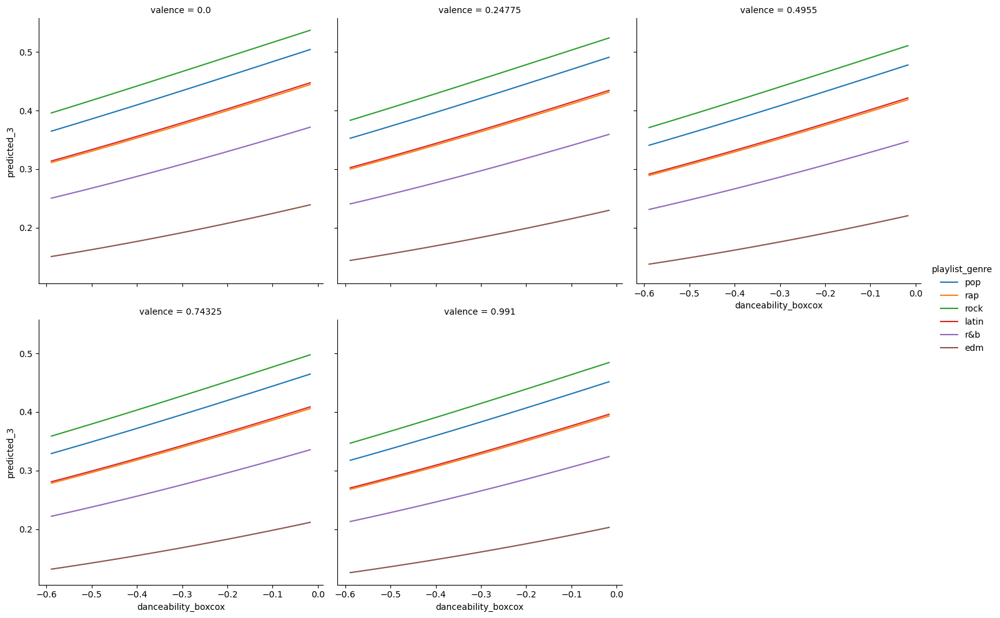

In [122]:
sns.relplot(data=dfviz,
    x="danceability_boxcox", y="predicted_3",
    hue="playlist_genre", 
    col="valence",  
    col_wrap=3,
    kind="line",
    palette="coolwarm" if input_grid["playlist_genre"].dtype != "object" else None 
)

plt.show()

Model 6 Visualizations

/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


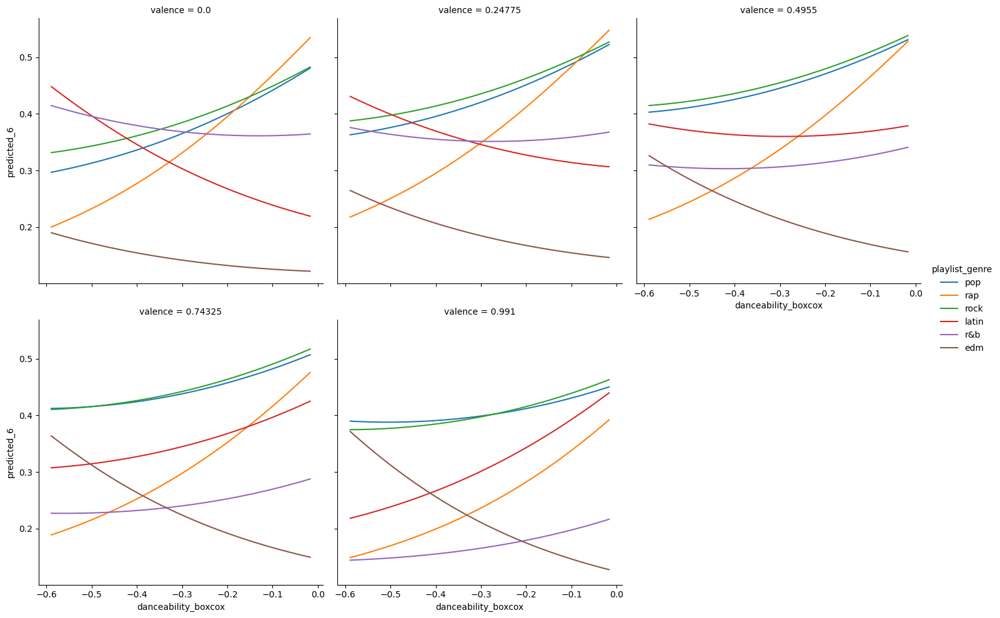

In [123]:
sns.relplot(data=dfviz,
    x="danceability_boxcox", y="predicted_6",
    hue="playlist_genre", 
    col="valence",  
    col_wrap=3,
    kind="line",
    palette="coolwarm" if input_grid["playlist_genre"].dtype != "object" else None 
)

plt.show()

Model 3 predictions are all linear and collinear but we see that Model 6 has predictions overlapping significantly! For instance, rap is positive and then decreases as valence increases.

## F. Models: Performance and Validation

In [109]:
from sklearn.pipeline import Pipeline

We will be looking at Models 2, 5, and 6.

In [106]:
def train_and_test_logistic_with_cv(mod_name, a_formula, init_mod, data_df, cv):
    # Create feature and output arrays based on provided formula
    y, X = dmatrices(a_formula, data=data_df)

    # Initialize the performance metric storage
    train_res = []
    test_res = []

    # Create a pipeline that standardizes the data and then fits the model
    pipeline = Pipeline([
        ('scaler', StandardScaler()),  # Step 1: Standardize the features
        ('model', init_mod)  # Step 2: Fit the model
    ])

    # Split the data and iterate over the folds
    for train_id, test_id in cv.split(X, y.ravel()):
        # Subset the training and testing features
        X_train = X[train_id]
        X_test = X[test_id]

        # Subset training and testing output
        y_train = y[train_id]
        y_test = y[test_id]

        # Fit the pipeline on the training set
        pipeline.fit(X_train, y_train.ravel())

        # Calculate the accuracy on the training set
        train_res.append(pipeline.score(X_train, y_train.ravel()))
        
        # Calculate the accuracy on the test set
        test_res.append(pipeline.score(X_test, y_test.ravel()))

    # Bookkeeping for the results
    train_df = pd.DataFrame({"Accuracy": train_res})
    train_df["from_set"] = "training" 
    train_df["fold_id"] = train_df.index + 1

    test_df = pd.DataFrame({"Accuracy": test_res})
    test_df["from_set"] = "testing" 
    test_df["fold_id"] = test_df.index + 1 

    # Combine the results together
    res_df = pd.concat([train_df, test_df], ignore_index=True)

    # Add additional information about the model
    res_df["model_name"] = mod_name
    res_df["model_formula"] = a_formula
    res_df["num_coefs"] = pipeline.named_steps['model'].coef_.ravel().size  # Get the number of coefficients

    return res_df

In [107]:
sk_min_loss = LogisticRegression(penalty=None, solver="lbfgs", fit_intercept=False, max_iter=25001)

In [104]:
spotify_cv = spotify_transf.loc[:, x_cluster + x_cats[0::2] + ["binary_outcome"]].copy()

NameError: name 'x_cluster' is not defined

In [128]:
spotify_cv

,acousticness_logit,danceability_boxcox,energy_logit,valence,key,playlist_genre,binary_outcome
3,-3.521738,-0.253422,2.586689,0.2770,7,pop,1
4,-2.438278,-0.305607,1.607040,0.7250,1,pop,1
6,-1.469622,-0.437889,1.782457,0.1520,5,pop,1
10,-1.766325,-0.283794,2.483824,0.7520,6,pop,1
12,-3.180661,-0.232522,0.974422,0.6870,1,pop,1
...,...,...,...,...,...,...,...
32828,-2.489465,-0.449713,2.469836,0.2100,2,edm,0
32829,-6.369550,-0.393774,1.300981,0.4000,0,edm,0
32830,-2.111335,-0.389303,1.523137,0.4360,6,edm,0
32831,-4.830413,-0.323154,2.070473,0.3080,2,edm,0


In [177]:
results_list = []

for m in range(len(formula_cesar)):
    results_list.append(train_and_test_logistic_with_cv(mod_name=str(m), 
                                                            a_formula=formula_cesar[m], 
                                                            init_mod=sk_min_loss,
                                                            data_df=spotify_transf, 
                                                            cv=kf))

In [178]:
cv_results = pd.concat(results_list, ignore_index=True)

In [179]:
cv_results

,Accuracy,from_set,fold_id,model_name,model_formula,num_coefs
0,0.576915,training,1,0,binary_outcome ~ acousticness_logit + danceabi...,16
1,0.574285,training,2,0,binary_outcome ~ acousticness_logit + danceabi...,16
2,0.575278,training,3,0,binary_outcome ~ acousticness_logit + danceabi...,16
3,0.574037,training,4,0,binary_outcome ~ acousticness_logit + danceabi...,16
4,0.579893,training,5,0,binary_outcome ~ acousticness_logit + danceabi...,16
...,...,...,...,...,...,...
85,0.563120,testing,1,8,binary_outcome ~ acousticness_logit + danceabi...,93
86,0.564510,testing,2,8,binary_outcome ~ acousticness_logit + danceabi...,93
87,0.567686,testing,3,8,binary_outcome ~ acousticness_logit + danceabi...,93
88,0.567289,testing,4,8,binary_outcome ~ acousticness_logit + danceabi...,93


/Applications/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


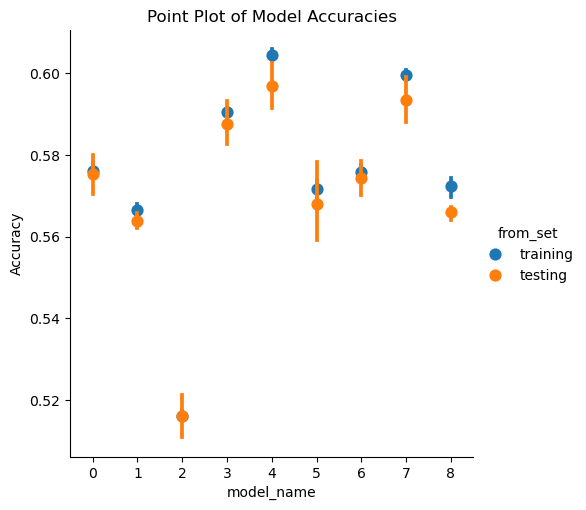

In [181]:
sns.catplot(data=cv_results, x="model_name", y="Accuracy", hue="from_set", kind="point", linestyle="None")
plt.title("Point Plot of Model Accuracies")
plt.show()

In order to achieve these results, I created a workflow in Pipeline that standardized the data at each fold and then ran the cross-validation with no penalty. 

From the Point Plot above, we see that model 5 might be the best since its testing Accuracy is close to the training Accuracy. Model 6 is not the best because it does way worse from training to testing. Model 5 only has 30 coefficients whereas Model 6 has 191. 